# Figures for paper

## Setup

In [671]:
%cd work/notebooks

[Errno 2] No such file or directory: 'work/notebooks'
/home/jovyan/work/notebooks


In [610]:
# Import modules and R
import numpy as np, pandas as pd
%load_ext rpy2.ipython
%load_ext autoreload
%autoreload 2

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2146]:
# Import local code
import sys
sys.path.append('../code')
from gradientVersion import *
from processing_helpers import *
from analysis_helpers import *
from triplets import *
from mri_maps import *
from enrichments import *
from disorders import *
from brainspan import *
%R source("../code/Rplots.R");
%R source("../code/brainPlots.R");
%R source("../code/enrichmentsPlots.R");
%R source("../code/plot_maps.R");
%R source("../code/brainspanPlots.R");

### Compute versions

In [1502]:
pca_base = gradientVersion(approach='pca', kernel=None).fit('hcp_base')
pca_3d_ds7 = gradientVersion(approach='pca', kernel=None).fit('hcp_3donors_ds7')
dme_ds8 = gradientVersion(approach='dm', kernel='normalized_angle', alpha=1).fit('hcp_ds8')
dme_3d_ds5 = gradientVersion(approach='dm', kernel='normalized_angle', alpha=1).fit('hcp_3donors_ds5')

New gradients version: method=pca, kernel=None, sparsity=0, data=hcp_base
New gradients version: method=pca, kernel=None, sparsity=0, data=hcp_3donors_ds7
New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=hcp_ds8
New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=hcp_3donors_ds5


Output scores and weights

In [613]:
dm_hcp_ds8.clean_scores().to_csv('../outputs/ahba_dme_hcp_top3kgenes_scores.csv')
dm_hcp_ds8.fit_weights().iloc[:,:3].set_axis(['G1','G2','G3'],axis=1).to_csv('../outputs/ahba_dme_hcp_top3kgenes_weights.csv')

dm_hcp_3d_ds5.clean_scores().to_csv('../outputs/ahba_dme_hcp_top8kgenes_scores.csv')
dm_hcp_3d_ds5.fit_weights().iloc[:,:3].set_axis(['G1','G2','G3'],axis=1).to_csv('../outputs/ahba_dme_hcp_top8kgenes_weights.csv')

KeyboardInterrupt: 

In [933]:
dm_hcp_3d_ds5.fit_weights(sort=True).to_csv('../outputs/dm_hcp_3d_ds5_weights_sorted.csv')

---

# Fig 1

### Axes plots

In [1618]:
versions_scores = pd.concat({
   'pca_base' : pca_base.clean_scores(),
   'pca_3d_ds7' : pca_3d_ds7.clean_scores(),
   'dme_3d_ds5' : dme_3d_ds5.clean_scores(),
   'dme_ds8' : dme_ds8.clean_scores()
}).reset_index(level=0).rename({'level_0':'version'},axis=1)

names_dict = {
    'pca_base':"atop(bold('1')*textstyle(' – PCA, all genes'), textstyle('all regions'))",
    'pca_3d_ds7':"atop(bold('2')*textstyle(' – PCA, top 30% genes'), textstyle('only 3+ donor regions'))",
    'dme_3d_ds5':"atop(bold('3')*textstyle(' – DME, top 50% genes'), textstyle('only 3+ donor regions'))",
    'dme_ds8':"atop(bold('4')*textstyle(' – DME, top 20% genes'), textstyle('all regions'))"
}
versions_scores = versions_scores.assign(version = lambda x: x['version'].map(names_dict))

In [1946]:
pca_base.expression.shape

(178, 15945)

### Triplets with filtering

In [ ]:
# triplets_hcp = get_triplets(atlas=fetch_hcp())
# save_pickle(triplets_hcp, "triplets_hcp")
triplets_hcp = load_pickle('triplets_hcp')
print("Got base triplets")
# triplets_hcp_3donors = get_triplets(atlas=fetch_hcp(), donors_threshold=3)
# save_pickle(triplets_hcp_3donors, "triplets_hcp_3donors")
triplets_hcp_3donors = load_pickle('triplets_hcp_3donors')
print("Got 3donors triplets")

Got base triplets
Got 3donors triplets


In [ ]:
triplets_hcp_2donors = get_triplets(atlas=fetch_hcp(), donors_threshold=2)
save_pickle(triplets_hcp_2donors, "triplets_hcp_2donors")
# triplets_hcp_2donors = load_pickle('triplets_hcp_2donors')
print("Got 2donors triplets")

Done triplet 012
Done triplet 013
Done triplet 014
Done triplet 015
Done triplet 023
Done triplet 024
Done triplet 025
Done triplet 034
Done triplet 035
Done triplet 045
Done triplet 123
Done triplet 124
Done triplet 125
Done triplet 134
Done triplet 135
Done triplet 145
Done triplet 234
Done triplet 235
Done triplet 245
Done triplet 345
Got 3donors triplets


Load triplets data from pickles since triplets are slow to compute

In [ ]:
# triplets_pca = make_triplet_ds_plot(get_triplets_stability_levels(triplets_hcp, approach='pca', kernel=None), with_coefs=False)
# triplets_dm = make_triplet_ds_plot(get_triplets_stability_levels(triplets_hcp, approach='dm', kernel='normalized_angle', alpha=1), with_coefs=False)
# triplets_pca_3d = make_triplet_ds_plot(get_triplets_stability_levels(triplets_hcp_3donors, approach='pca', kernel=None), with_coefs=False)
# triplets_dm_3d = make_triplet_ds_plot(get_triplets_stability_levels(triplets_hcp_3donors, approach='dm', kernel='normalized_angle', alpha=1), with_coefs=False)

KeyboardInterrupt: 

In [ ]:
triplets_pca_2d = make_triplet_ds_plot(get_triplets_stability_levels(triplets_hcp_2donors, approach='pca', kernel=None))
triplets_dm_2d = make_triplet_ds_plot(get_triplets_stability_levels(triplets_hcp_2donors, approach='dm', kernel='normalized_angle', alpha=1))

Computed triplet stability
Computed triplet stability


In [ ]:
# triplets_dict = {
#     'PCA, all regions': triplets_pca, 
#     'PCA, only 3+ donor regions': triplets_pca_3d,
#     'DME, only 3+ donor regions': triplets_dm_3d,
#     'DME, all regions': triplets_dm
# }
# save_pickle(triplets_dict, 'triplets_dict')
triplets_dict = load_pickle('triplets_dict')

triplets_plot_v2 = (pd.concat(triplets_dict)
 .reset_index(0)
 .rename({'level_0':'method', 'version':'DS'}, axis=1)
 .assign(method = lambda x: pd.Categorical(x['method'], ordered=True, categories=triplets_dict.keys()))
                   )

triplets_highlights = [0,.8,.5,.8]
df_triplets_highlight = pd.DataFrame({'method': triplets_dict.keys(), 'DS':triplets_highlights}).assign(method = lambda x: pd.Categorical(x['method'], ordered=True, categories=triplets_dict.keys()))

In [ ]:
triplets_dict['PCA, all regions']

,how,version,component,pair,corr,corr_abs
0,Region scores,0.0,1,012-345,0.774335,0.774335
1,Region scores,0.0,2,012-345,0.041373,0.041373
2,Region scores,0.0,3,012-345,0.245817,0.245817
3,Region scores,0.0,4,012-345,0.106467,0.106467
4,Region scores,0.0,5,012-345,-0.107603,0.107603
...,...,...,...,...,...,...
495,Region scores,0.9,1,045-123,-0.907615,0.907615
496,Region scores,0.9,2,045-123,-0.772870,0.772870
497,Region scores,0.9,3,045-123,-0.517418,0.517418
498,Region scores,0.9,4,045-123,-0.155683,0.155683


### Check alignment with six brains

In [ ]:
triplets_hcp_3donors_pca_ds_levels = get_triplets_stability_levels(triplets_hcp_3donors, approach='pca', kernel=None)

KeyboardInterrupt: 

In [ ]:
triplet_corrs = {}
for name, triplet in triplets_hcp_3donors_pca_ds_levels[0.8].items():
    triplet_corrs[name] = pca_hcp_3d_ds8.corr_scores(triplet, match=True)['corr']
pd.concat(triplet_corrs, axis=1).mean(axis=1)

NameError: name 'triplets_hcp_3donors_pca_ds_levels' is not defined

### Variance explained

In [ ]:
dm_hcp_3d_ds8 = gradientVersion(approach='dm', kernel='normalized_angle', alpha=1).fit('hcp_3donors_ds8')

New gradients version: method=dm, params={'alpha': 1}, kernel=normalized_angle, sparsity=0, data=hcp_3donors_ds8


In [ ]:
pca_hcp_3d_ds8.var / pca_hcp_3d_ds8.expression.var().sum()

array([0.51285959, 0.11362159, 0.06620111, 0.03990287, 0.02690718])

In [ ]:
dm_hcp_3d_ds8.scores.var().values / dm_hcp_3d_ds8.affinity.var()

array([0.68028121, 0.06203807, 0.03835231, 0.01129727, 0.00665823])

In [ ]:
df_var = pd.DataFrame({
    'PCA all': pca.var / pca.expression.var().sum(),
    'PCA 3+ DS8': pca_hcp_3d_ds8.var / pca_hcp_3d_ds8.expression.var().sum(),
    'DM 3+ DS8': dm_hcp_3d_ds8.scores.var().values / dm_hcp_3d_ds8.affinity.var(),
    'DM 3+ DS5': dm_hcp_3d_ds5.scores.var().values / dm_hcp_3d_ds5.affinity.var()    
}, index=[i+1 for i in range(5)]).melt(ignore_index=False).reset_index().set_axis(['PC','which','var'],axis=1)

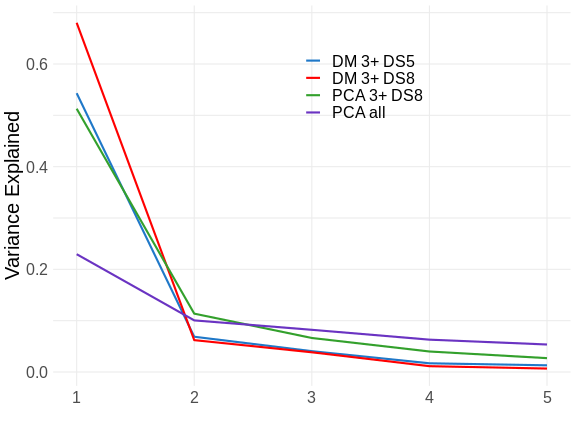

In [ ]:
%%R -i df_var -w 8 -h 6 --units in
source("../code/Rplots.R")
plot_var_exp(df_var) + 
theme(text=element_text(size=20), panel.grid.minor.y=element_line())

In [ ]:
df_var.set_index(['PC','which']).unstack(1)

var                               
which DM 3+ DS5 DM 3+ DS8 PCA 3+ DS8   PCA all
PC                                            
1      0.543100  0.680281   0.512860  0.229431
2      0.068633  0.062038   0.113622  0.100492
3      0.040521  0.038352   0.066201  0.082149
4      0.016900  0.011297   0.039903  0.062958
5      0.012982  0.006658   0.026907  0.053519

### Medians and mins

In [ ]:
print('Median inter-triplet abs correlation:')
triplets_plot_v2.groupby(['method','component','DS']).median()['corr_abs'].unstack('DS').rename_axis('DS',axis=1)

Median inter-triplet abs correlation:


DS                                         0.0       0.1       0.2       0.3  \
method                     component                                           
PCA, all regions           1          0.721299  0.748945  0.778971  0.807344   
                           2          0.118019  0.110347  0.159537  0.171453   
                           3          0.112725  0.125533  0.117388  0.069135   
                           4          0.145198  0.139684  0.202680  0.155137   
                           5          0.298828  0.336792  0.404655  0.448716   
PCA, only 3+ donor regions 1          0.943951  0.945355  0.947445  0.950455   
                           2          0.641327  0.641444  0.650353  0.673907   
                           3          0.503075  0.532790  0.530572  0.481658   
                           4          0.216319  0.195388  0.149461  0.228965   
                           5          0.181065  0.212523  0.186535  0.161470   
DME, only 3+ donor regions 1          0.940689  0.942601  0.945681  0.949023   
                           2          0.708939  0.701071  0.720477  0.727123   
                           3          0.538528  0.545562  0.579053  0.582787   
                           4          0.241565  0.278260  0.196520  0.203972   
                           5          0.286040  0.289447  0.277359  0.240177   
DME, all regions           1          0.779795  0.797478  0.820583  0.838769   
                           2          0.088497  0.130029  0.177378  0.227729   
                           3          0.140237  0.120844  0.143643  0.136673   
                           4          0.209643  0.335823  0.459604  0.335729   
                           5          0.341804  0.362637  0.307705  0.268746   

DS                                         0.4       0.5       0.6       0.7  \
method                     component                                           
PCA, all regions           1          0.833313  0.855669  0.872687  0.887131   
                           2          0.171673  0.202981  0.307654  0.370857   
                           3          0.113449  0.144438  0.212100  0.482574   
                           4          0.227536  0.274783  0.483740  0.198495   
                           5          0.463628  0.214419  0.105734  0.162206   
PCA, only 3+ donor regions 1          0.954674  0.957945  0.962631  0.966237   
                           2          0.691238  0.731108  0.783653  0.841516   
                           3          0.513034  0.511717  0.489941  0.619852   
                           4          0.228333  0.251535  0.288701  0.348012   
                           5          0.217577  0.268531  0.247937  0.131774   
DME, only 3+ donor regions 1          0.952160  0.956244  0.959857  0.965207   
                           2          0.728556  0.726947  0.735955  0.787616   
                           3          0.591061  0.649015  0.739045  0.782970   
                           4          0.307773  0.279736  0.371368  0.479106   
                           5          0.288111  0.332485  0.375019  0.259159   
DME, all regions           1          0.853084  0.867552  0.883273  0.896015   
                           2          0.302840  0.500902  0.573158  0.631447   
                           3          0.297029  0.229392  0.310658  0.471018   
                           4          0.396860  0.311541  0.199251  0.268660   
                           5          0.282312  0.176209  0.288640  0.124639   

DS                                         0.8       0.9  
method                     component                      
PCA, all regions           1          0.900200  0.913372  
                           2          0.557307  0.795161  
                           3          0.476907  0.441650  
                           4          0.259545  0.392915  
                           5          0.145571  0.266259  
PCA, only 3+ donor regions 1          0.968536  0.971698  
      

### Versions corrs

In [ ]:
for G in ['G1','G2','G3']:
    print(G)
    display(versions_scores.set_index(['label','version'])[G].unstack().corr())

G1


version,"DME, all regions,\ntop 20% genes","DME, only 3+ donor regions,\ntop 50% genes","PCA, all regions and genes","PCA, only 3+ donor regions,\ntop 20% genes"
version,,,,
"DME, all regions,\ntop 20% genes",1.000000,0.998607,0.938777,0.995128
"DME, only 3+ donor regions,\ntop 50% genes",0.998607,1.000000,0.955483,0.995502
"PCA, all regions and genes",0.938777,0.955483,1.000000,0.954239
"PCA, only 3+ donor regions,\ntop 20% genes",0.995128,0.995502,0.954239,1.000000


G2


version,"DME, all regions,\ntop 20% genes","DME, only 3+ donor regions,\ntop 50% genes","PCA, all regions and genes","PCA, only 3+ donor regions,\ntop 20% genes"
version,,,,
"DME, all regions,\ntop 20% genes",1.000000,0.936557,0.621186,0.825476
"DME, only 3+ donor regions,\ntop 50% genes",0.936557,1.000000,0.592436,0.954627
"PCA, all regions and genes",0.621186,0.592436,1.000000,0.499531
"PCA, only 3+ donor regions,\ntop 20% genes",0.825476,0.954627,0.499531,1.000000


G3


version,"DME, all regions,\ntop 20% genes","DME, only 3+ donor regions,\ntop 50% genes","PCA, all regions and genes","PCA, only 3+ donor regions,\ntop 20% genes"
version,,,,
"DME, all regions,\ntop 20% genes",1.000000,0.884786,-0.058510,0.666910
"DME, only 3+ donor regions,\ntop 50% genes",0.884786,1.000000,-0.079200,0.883315
"PCA, all regions and genes",-0.058510,-0.079200,1.000000,-0.013067
"PCA, only 3+ donor regions,\ntop 20% genes",0.666910,0.883315,-0.013067,1.000000


### Cross-correlation

In [ ]:
# Scores
dm_hcp_3d_ds5.clean_scores().corr()

,G1,G2,G3
G1,1.000000e+00,4.792989e-08,-2.059994e-07
G2,4.792989e-08,1.000000e+00,3.827356e-08
G3,-2.059994e-07,3.827356e-08,1.000000e+00


In [ ]:
# Weights
dm_hcp_3d_ds5.weights.iloc[:,:3].set_axis(['G1','G2','G3'],axis=1).corr()

,G1,G2,G3
G1,1.000000,-0.038875,0.018487
G2,-0.038875,1.000000,0.104590
G3,0.018487,0.104590,1.000000


### Smoothness (Moran's I)

In [ ]:
versions_scores.iloc[:,:4].groupby('version', sort=False).agg(get_moran_I).T

version,"PCA, all regions and genes","PCA, only 3+ donor regions,\ntop 20% genes","DME, only 3+ donor regions,\ntop 50% genes","DME, all regions,\ntop 20% genes"
G1,0.497240,0.463211,0.485249,0.511465
G2,0.227112,0.661179,0.583125,0.488972
G3,-0.006063,0.218570,0.206296,0.292110


### XYZ corrs

In [898]:
def get_xyz_corrs(version):
    hcp_xyz = fetch_hcp()['info'].loc[:180,['id','x-cog','y-cog','z-cog']].set_index('id').set_axis(['x','y','z'],axis=1)
    return version.clean_scores().join(hcp_xyz).corr().iloc[3:,:3]

get_xyz_corrs(dm_hcp_3d_ds5)

,G1,G2,G3
x,0.031359,-0.072656,-0.387193
y,-0.636938,0.495609,0.029678
z,0.535941,0.579279,0.163890


In [896]:
get_xyz_corrs(dm_hcp_ds8)

,G1,G2,G3
x,0.058231,-0.005008,-0.355069
y,-0.658762,0.413485,0.169162
z,0.472240,0.560624,0.318039


In [897]:
get_xyz_corrs(pca_hcp_3d_ds8)

,G1,G2,G3
x,0.037339,-0.247941,-0.282688
y,-0.610660,0.518786,-0.201123
z,0.537872,0.609495,0.086467


### Figure

In [ ]:
triplets_raster = load_pickle('triplets_raster')

In [854]:
triplets_raster.query("method=='dm' & component=='2'")

,component,method,donors_filter,gene_filter,corr,corr_abs
60,2,dm,1,0.0,0.034729,0.088497
61,2,dm,1,0.1,0.116548,0.130029
62,2,dm,1,0.2,0.123702,0.177378
63,2,dm,1,0.3,0.227729,0.227729
64,2,dm,1,0.4,0.120348,0.302840
65,2,dm,1,0.5,0.180069,0.500902
66,2,dm,1,0.6,0.486816,0.573158
67,2,dm,1,0.7,0.029196,0.631447
68,2,dm,1,0.8,-0.629905,0.723661
69,2,dm,1,0.9,-0.760602,0.801362


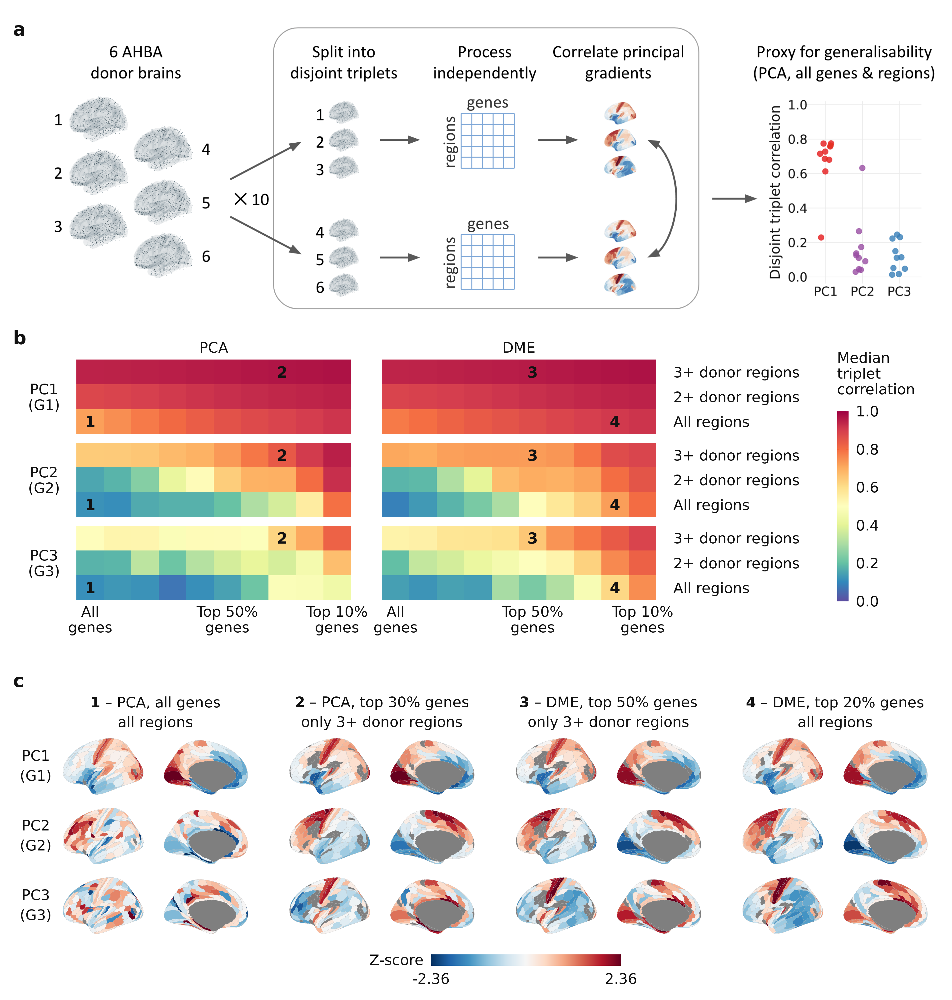

In [1619]:
%%R -w 20 -h 21 --units in -r 200 -i triplets_raster -i versions_scores -i versions_scatter
source("../code/Rplots.R")
source("../code/brainPlots.R")
library(png)
img_path <- "../data/schematics/schem3.png"
img <- readPNG(img_path, native=T)

g0 <- ggplot() + theme(plot.tag.position=c(0,.95)) + inset_element(img, left=0,right=1,top=1,bottom=0, align_to='panel',ignore_tag=T)
g2 <- plot_triplets_raster(triplets_raster) + theme(plot.tag.position=c(0,1))
    # theme(axis.text.y=element_text(margin=margin(r=-40)))
g3 <- plot_hcp(versions_scores, spacing_x=2, switch='y', G_PC_labels=T) + 
    guides(fill=guide_colorbar(barwidth=20, title='Z-score', title.vjust=1)) +
    theme(strip.text.y=element_text(margin=margin(l=10))) +
    theme(plot.tag.position=c(0, .95))

layout <- c(
  area(t = 1, b = 19, l = 1, r = 48),
  area(t = 20, b = 34, l = 1, r = 47),
  area(t = 35, b = 48, l = 1, r = 48)
)

plot <- g0 + g2 + g3 + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    # axis.text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    # plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)


annotated <- themed + plot_annotation(
  tag_level='a',
  # caption = caption,
  theme = theme(plot.caption = element_textbox_simple(size = 20, padding = unit(c(40, 5, 5, 5), "pt")))
)
annotated
# ggsave(filename='test2.png', device='png')

---

# Fig 2

In [2027]:
weights_version = dm_hcp_3d_ds5
weights = weights_version.weights.iloc[:,:3]
nulls = shuffle_gene_weights(weights, n=5000, rank=False)
weights_version_scores = weights_version.clean_scores()

### Gene weight vs DS

In [904]:
stability = pd.read_csv("../outputs/stability_hcp_ranked.csv", index_col=0).set_index('gene_symbol')
weights_ds = weights.set_axis(['G1','G2','G3'],axis=1).join(stability)

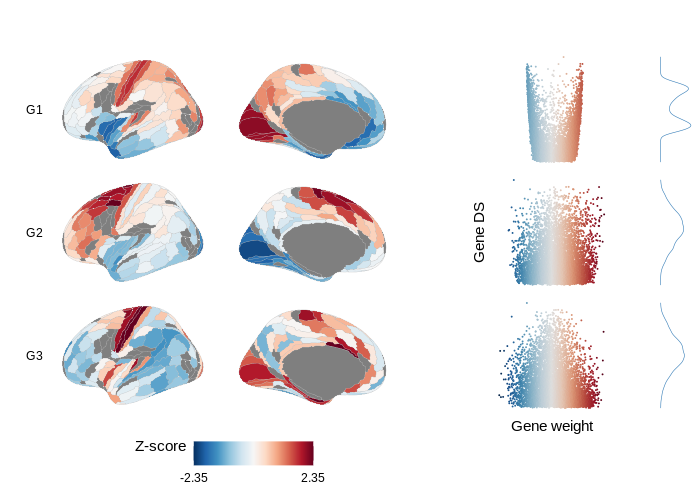

In [905]:
%%R -i weights_version_scores -i weights_ds -w 7 -h 5 --units in -r 100
source("../code/brainPlots.R")
source("../code/Rplots.R")
(plot_hcp(weights_version_scores, switch='y') | 
 plot_weights_ds(weights_ds, ncol=1) |
 plot_weights_dist(weights_ds)
) + plot_layout(widths=c(12,6,1))

### Layer enrichments

In [1662]:
layer_genes = get_layer_genes(which='maynard', add_hse_genes=True)
layer_stats = compute_null_p(*compute_enrichments(weights, nulls, layer_genes))
layer_stats

,label,G,pct,true_mean,null_mean,null_std,z,pos,p,q,sig
0,HSE,G1,0.9780,0.469018,0.005655,0.228735,2.025760,True,0.0440,0.052800,False
1,HSE,G2,0.9974,0.650204,0.002416,0.228013,2.841012,True,0.0052,0.007800,True
2,HSE,G3,0.0050,-0.598932,0.003893,0.231275,-2.606530,False,0.0100,0.013333,True
3,L1,G1,0.0000,-0.444851,-0.000420,0.037814,-11.752952,False,0.0000,0.000000,True
4,L1,G2,0.5052,0.000116,-0.000252,0.037531,0.009820,True,0.9896,0.989600,False
5,L1,G3,1.0000,0.649191,0.000240,0.037766,17.183287,True,0.0000,0.000000,True
6,L2,G1,0.0000,-0.387702,-0.000319,0.036444,-10.629638,False,0.0000,0.000000,True
7,L2,G2,0.0000,-0.493077,-0.000011,0.037150,-13.272386,False,0.0000,0.000000,True
8,L2,G3,0.0000,-0.789007,0.000561,0.035955,-21.959994,False,0.0000,0.000000,True
10,L3,G2,0.6968,0.056895,-0.000068,0.107059,0.532068,True,0.6064,0.632765,False


### Cell enrichments

In [908]:
cell_genes = get_cell_genes(which='jakob', add_synapses=True)
order = ['Synapses', 'Neuro-Ex', 'Neuro-In', 'Astro', 'Micro', 'Endo', 'Oligo', 'OPC']
true_scores, null_scores = compute_enrichments(weights, nulls, cell_genes, how='mean')
cell_null_p = compute_null_p(true_scores, null_scores, adjust='fdr_bh', order=order)

In [909]:
cell_rename = {
    'Neuro-Ex':'Neurons (Ex.)',
    'Neuro-In':'Neurons (In.)',
    'Astro':'Astrocytes',
    'Micro':'Microglia',
    'Endo':'Endothelial cells',
    'Oligo':'Oligodendrocytes',
    'OPC':'OPC'
}
    
cell_null_p = cell_null_p.replace({'label':cell_rename})


### Gene maps

In [910]:
# # celltypes = ['Astro', 'Micro', 'Oligo']
# order = ['Synapses', 'Neuro-Ex', 'Neuro-In', 'Astro', 'Micro', 'Endo', 'Oligo', 'OPC']
# cell_genes = get_cell_genes(which='jakob', add_synapses=True) #.loc[lambda x: np.isin(x['label'], celltypes)]
# gene_maps = make_gene_maps(weights_version, cell_genes, order=order, normalize='std', method='mean')
# gene_maps = gene_maps.rename(cell_rename, axis='columns')

In [911]:
# # single_genes = ['ALDH1L1','AIF1','MOG']
# # single_genes = pd.DataFrame({'gene':single_genes, 'label':single_genes})
# # single_gene_maps = make_gene_maps(weights_version, single_genes, normalize='std', method='mean')

# gene_maps = (pd.concat([single_gene_maps, cell_gene_maps], axis=1)
#              .apply(lambda x: (x-np.mean(x))/np.std(x))
#             )

In [912]:
# %%R -i gene_maps -w 8 -h 8 --units in -r 100
# source("../code/plot_maps.R")
# colors <- rev(brewer.rdbu(100))
# # p1 <- plot_maps(single_gene_maps, ncol=1, colors=colors, colorscale='absolute')
# # p2 <- plot_maps(cell_gene_maps, ncol=1, colors=colors, colorscale='absolute')
# # p1 | p2
# plot_maps(gene_maps, ncol=2, colors=colors, colorscale='absolute')


Error in (1 - h) * qs[i] : non-numeric argument to binary operator


RInterpreterError: Failed to parse and evaluate line 'source("../code/plot_maps.R")\ncolors <- rev(brewer.rdbu(100))\n# p1 <- plot_maps(single_gene_maps, ncol=1, colors=colors, colorscale=\'absolute\')\n# p2 <- plot_maps(cell_gene_maps, ncol=1, colors=colors, colorscale=\'absolute\')\n# p1 | p2\nplot_maps(gene_maps, ncol=2, colors=colors, colorscale=\'absolute\')\n'.
R error message: 'Error in (1 - h) * qs[i] : non-numeric argument to binary operator'

### Brainspan mapping

In [914]:
hcp_bs_mapping = get_hcp_bs_mapping_v2()

In [1467]:
bs_exp, bs_col, bs_row = get_brainspan()
bs_clean = clean_brainspan(bs_exp, bs_col, bs_row, hcp_bs_mapping)
bs_agg = aggregate_brainspan_by_age(bs_clean)

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


In [1486]:
bs_clean.groupby(['donor_id', 'age']).size().loc[lambda x: x>3].sort_index(level=1).shape

(35,)

### Brainspan development

In [1658]:
hcp_mapped_scores = get_mapped_scores(weights_version, hcp_bs_mapping)
bs_scores = compute_brainspan_scores(bs_agg, weights_version)

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


In [1659]:
age_groups = get_age_groups()
bs_scores_corr = correlate_brainspan_scores(bs_scores, hcp_mapped_scores, age_groups=age_groups)

In [1661]:
bs_scores_corr.sort_values('age')

,age,G,corr
0,Pre-Birth,G1,0.736172
3,Pre-Birth,G2,0.664595
6,Pre-Birth,G3,0.288185
1,Birth-13 yrs,G1,0.874856
4,Birth-13 yrs,G2,0.909465
7,Birth-13 yrs,G3,0.472560
2,18-40 yrs,G1,0.957978
5,18-40 yrs,G2,0.881621
8,18-40 yrs,G3,0.837774


### Brainspan adult correlation

In [1479]:
both_scores, both_corrs = combine_scores(bs_scores, hcp_mapped_scores, age_groups)

In [1480]:
scores_plot = make_brain_plots(weights_version, hcp_bs_mapping, bs_scores).replace({'version':{'BrainSpan':'BrainSpan 18-40yrs'}})

### GO enrichments

In [ ]:
go_enrichments = combine_enrichments('dm_hcp_3d_ds5', 'Process', include_g1=False, top_n=5, filter_001=False) 
go_enrichments = go_enrichments.replace({'G':{
    'G1':'G1: Translation vs Targeting', 
    'G2':'G2: Metabolic vs Regulatory', 
    'G3':'G3: Immune vs Synaptic'}})

### Fig

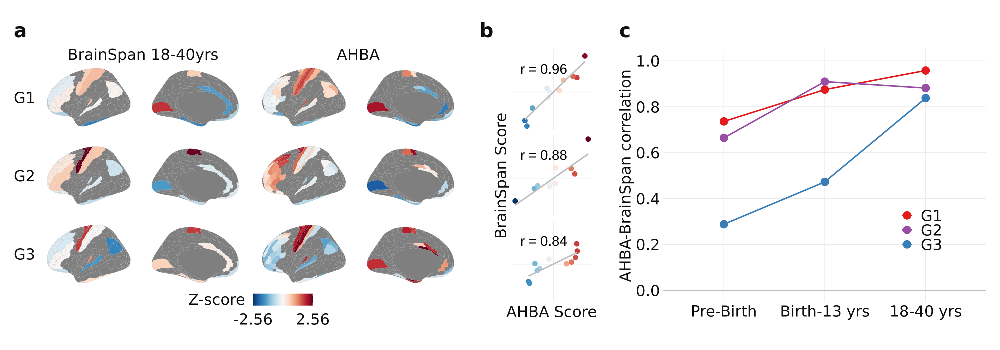

In [1481]:
%%R -w 20 -h 7 --units in -r 200 -i hcp_bs_mapping -i both_scores -i both_corrs -i scores_plot -i bs_scores_corr
source("../code/Rplots.R")
source("../code/brainspanPlots.R")
source("../code/brainPlots.R")

# g10 <- plot_bs_hcp_mapping(hcp_bs_mapping, xlab='BrainSpan regions\nmatched to HCP-MMP1.0') + theme(plot.margin=margin(r=-50, 'pt'), plot.tag.position=c(0,.95))
g11 <- plot_hcp(scores_plot, facet='h', switch='y') + theme(
            plot.tag.position = c(0.1, .9),
            strip.text.x=element_text(size=22), 
            strip.text.y.left=element_text(size=22, margin=margin(l=0)),
            legend.position=c(.5,-.1),
            legend.direction='horizontal',
            legend.title=element_text(vjust=1),
            panel.spacing.y = unit(1, 'lines')
            )
g12 <- plot_ahba_bs_scatter(both_scores, both_corrs, facet='v', size=3) + theme(
            strip.text.y = element_blank(),
            axis.title.y = element_text(angle=90,size=22, color='grey7', family='Calibri'),
            axis.title.x=element_text(size=22, color='grey7', family='Calibri')
)
g13 <- plot_bs_scores_corr(bs_scores_corr) + 
    theme(legend.position=c(.8,.3), plot.tag.position = c(0, .95),
          axis.text=element_text(size=22, color='grey7', family='Calibri')
         )
    
layout <- c(
    # area(t=1,b=24,l=1,r=8),
    # area(t=1,b=24,l=9,r=30),
    area(t=1,b=24,l=1,r=24),
    area(t=1,b=24,l=25,r=30),
    area(t=1,b=24,l=31,r=48)
)

# plot <- g10 + g11 + g12 + g13 + plot_layout(design=layout)
plot <- g11 + g12 + g13 + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    # axis.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    plot.tag.position = c(0, .95),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

g_brainspan = themed + plot_annotation(tag_level='a')
g_brainspan

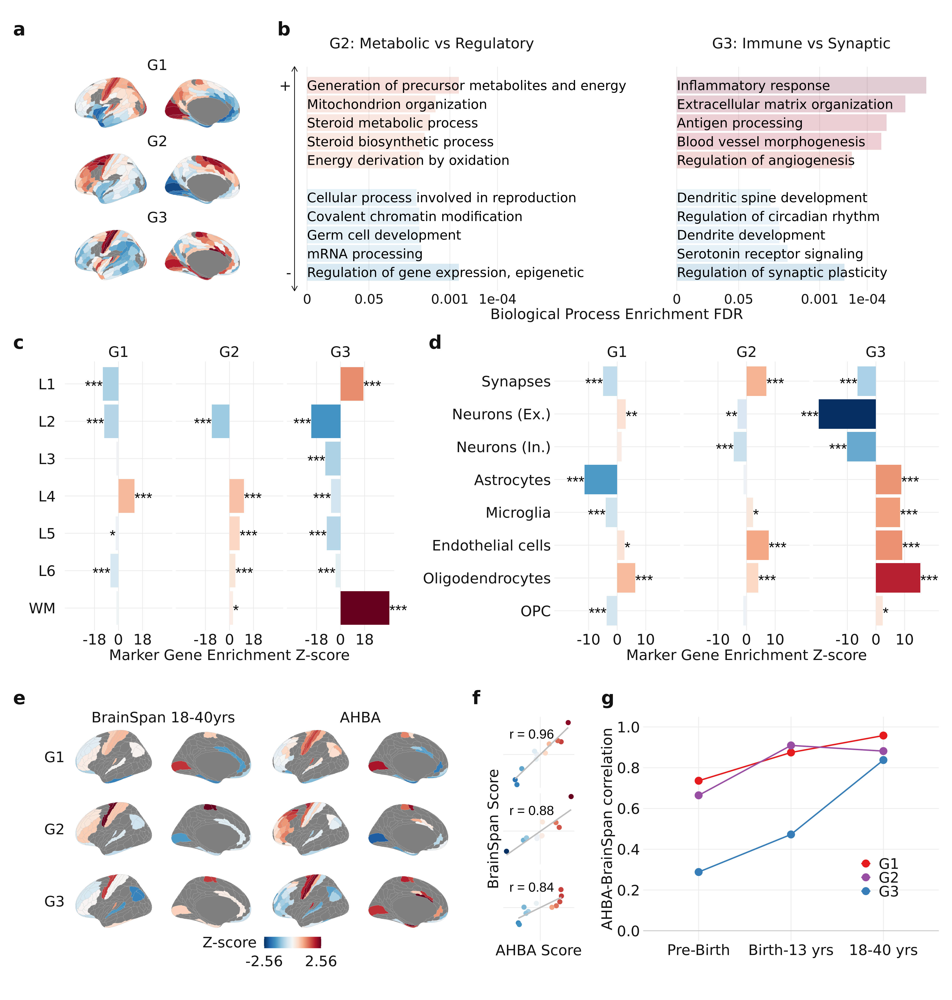

In [1653]:
%%R -w 20 -h 21 --units in -r 200 -i go_enrichments -i gene_maps -i cell_null_p -i layer_stats -i hcp_bs_mapping -i both_scores -i both_corrs -i scores_plot -i bs_scores_corr
source("../code/Rplots.R")
source("../code/brainPlots.R")
source("../code/enrichmentsPlots.R")
source("../code/brainspanPlots.R")


# g1a <- plot_hcp(hcp_scores %>% mutate(version='Region scores'), switch='both') + 
g1 <- plot_hcp(weights_version_scores, facet='w') + guides(fill='none') +
        theme(plot.tag.position=c(0,.95))
# g1b <- plot_weights_ds(weights_ds,ncol=1) + plot_layout(tag_level='new')
g2 <- plot_go_enrichments(go_enrichments, size=7, name='Biological Process Enrichment FDR') + 
        theme(axis.text.y = element_text(size=22, color='grey7', family='Calibri')) +
        theme(plot.tag.position=c(0,.95), plot.margin=margin(b=50))
g3 <- plot_enrichment_bars_z(layer_stats, xlab='Marker Gene Enrichment Z-score') + 
        theme(axis.text.y = element_text(margin=margin(r=-20, 'pt'), size=22, color='grey7', family='Calibri'),
              axis.text.x = element_text(size=22, color='grey7', family='Calibri')) +
        theme(plot.tag.position=c(0,1))
g4 <- plot_enrichment_bars_z(cell_null_p, xlab='Marker Gene Enrichment Z-score') + 
        theme(axis.text = element_text(size=22, color='grey7', family='Calibri')) +
        theme(plot.tag.position=c(0.04,1))


layout <- c(
    area(t=1,b=15,l=1,r=13),
#     area(t=1,b=15,l=14,r=18),
    # area(t=1,b=15,l=18,r=19),    
    
    area(t=1,b=15,l=15,r=48),
    
    area(t=16,b=33,l=1,r=21),
    area(t=16,b=33,l=22,r=48),

    area(t=34,b=48,l=1,r=48)    
)
    
plot <- g1 + g2 + g3 + g4 + g_brainspan + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=20, l=10, "pt"),
    # plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)


annotated <- themed + plot_annotation(
  tag_level='a',
  # caption = caption,
  theme = theme(plot.caption = element_textbox_simple(size = 20, padding = unit(c(40, 5, 5, 5), "pt")))
)
annotated

---

# Fig 3

In [2169]:
maps=get_maps()
hcp_scores = dm_hcp_3d_ds5.clean_scores()
# hcp_scores = dm_hcp_3d_ds5.clean_scores()
# hcp_scores = pca_hcp_3d_ds8.clean_scores()
corrs = get_corrs(hcp_scores, maps, method='pearson')
corrs

,G1,G2,G3
T1T2,0.737292,-0.164203,0.274941
thickness,-0.675996,0.122564,-0.099362
G1_fMRI,-0.380928,0.159012,-0.301346
PC1_neurosynth,-0.233336,-0.298729,-0.241495
externopyramidisation,0.082982,-0.568401,-0.158901
glasser_GI,0.178845,0.658777,-0.182138
hill.evo_remapped,-0.197442,0.448192,-0.313754
hill.dev_remapped,-0.076469,0.438692,-0.106871
glasser_CBF,0.318041,0.363822,0.097648
allom,0.161526,0.215161,-0.291980


In [2170]:
null_grads = np.load("../outputs/permutations/hcp_3d_ds5_spin_5000.npy")
null_p = corr_nulls_from_grads(null_grads, hcp_scores, maps, method='pearsonr', adjust=None)

In [2171]:
long_names = {
        'T1T2':'Myelination (T1w/T2w)',
        'thickness':'Thickness (CT)',    
        'G1_fMRI': 'fMRI connectivity G1',
        'PC1_neurosynth': 'NeuroSynth PC1 (NS PC1)',    
        #'glasser_CMRO2':'Oxy. Metabolism (CMRO2)',
        # 'glasser_CMRGlu':'Glu. Metabolism (CMRGlu)',
        'allom':'Allometric Scaling (Allom.)',  
        'glasser_GI':'Aerobic Glycolysis (AG)',
        'hill.evo_remapped':'Evolutionary Expansion (Evo. Exp.)',
        'hill.dev_remapped':'Dev. Expansion (Dev. Exp.)',
        'glasser_CBF':'Cerebral Blood Flow (CBF)',
        'externopyramidisation':'Externopyramidisation (Ext.)'
}
    
short_names = {
        'T1T2':'T1w/T2w',
        'thickness':'CT',
        'G1_fMRI':'fMRI G1',
        'PC1_neurosynth':'NS PC1',    
        # 'glasser_CMRO2':'CMRO2',
        # 'glasser_CMRGlu':'CMRGlu',
        'glasser_GI':'AG',
        'hill.dev_remapped':'Dev. Exp.',
        'hill.evo_remapped':'Evo. Exp.',
        'externopyramidisation':'Ext.',
        'glasser_CBF':'CBF',
        'allom':'Allom.'
}
null_p_rename = (null_p
        .set_index('map').loc[long_names.keys()].reset_index()
        .assign(map = lambda x: x['map'].map(short_names))
)
maps_rename = maps.rename(columns=long_names).loc[:,long_names.values()]

### Scatter

In [37]:
# maps_scatter_names = {
#     # 'Myelination (T1w/T2w)':'Myelination\n(T1w/T2w)',
#     'Oxygen Metabolism (CMRO2)':'Oxygen\nMetabolism',
#     'Glycolytic Index (AG)':'Glycolytic\nIndex'
# }
# maps_scatter = (maps
#                 .loc[:,maps_scatter_names.keys()]
#                 .melt(ignore_index=False, var_name='map', value_name='map_score')
#                 .join(hcp_scores.set_index('label')).reset_index()
#                 .replace({'map':maps_scatter_names})
#                 .drop('G3',axis=1)
#                )
# maps_scatter_corrs = (null_p.query("map in @maps_scatter_names.keys()")
#                       .loc[:,['map','G','true_mean','q']]
#                       .replace({'map':maps_scatter_names})
#                       .loc[lambda x: x['G'] != 'G3']
#                      )

### PCA

In [2172]:
pca_scores, pca_var, pca_weights = maps_pca(maps, short_names)
pca_scores = (pca_scores.iloc[:,[0,1]] * [-1,-1]).reset_index()

In [2173]:
pca_weights

,MRI PC1,MRI PC2,MRI PC3,map_name
T1T2,0.332366,-0.409737,0.207512,T1w/T2w
thickness,-0.192132,0.457254,-0.265105,CT
G1_fMRI,-0.419280,0.281886,0.375155,fMRI G1
PC1_neurosynth,-0.052920,0.418097,0.607794,NS PC1
externopyramidisation,0.321587,0.248761,-0.020594,Ext.
glasser_GI,-0.414454,-0.258373,0.294931,AG
hill.evo_remapped,-0.385018,-0.027477,-0.410459,Evo. Exp.
hill.dev_remapped,-0.379048,-0.062994,-0.170270,Dev. Exp.
glasser_CBF,-0.179644,-0.416512,0.285869,CBF
allom,-0.273211,-0.248848,-0.099529,Allom.


In [2174]:
pca_var

array([0.31103521, 0.19970867, 0.14094252])

In [2175]:
ahba_scores = hcp_scores.drop('G3', axis=1).set_axis(['G1', 'G2', 'label'], axis=1)

In [2176]:
maps_pca_scatter = (pd.concat({
    'MRI PCA': pca_scores.set_axis(['label','G2','G1'],axis=1).set_index('label'),
    'AHBA DM': hcp_scores.drop('G3', axis=1).set_index('label')}, 
    axis=1)
 .stack(1).reset_index().rename({'level_1':'G'},axis=1)
 .replace({'G':{'G1':'MRI PC2 vs G1', 'G2':'MRI PC1 vs G2'}})
 .sort_values('G')
)
# maps_pca_scatter

In [2177]:
pca_corrs = get_corrs(hcp_scores, pca_scores.set_index('label'))
pca_null_p = corr_nulls_from_grads(null_grads, hcp_scores, pca_scores.set_index('label'), method='pearsonr', adjust=None)
maps_pca_corrs = (pca_null_p
                     .loc[:,['map','G','r','q']]
                     .loc[lambda x: (x['G']=='G1') & (x['map']=='MRI PC2') | 
                                    (x['G']=='G2') & (x['map']=='MRI PC1')]
                     .replace({'G':{'G1':'MRI PC2 vs G1', 
                                    'G2':'MRI PC1 vs G2'}})
                    )

In [2178]:
pca_null_p

,G,map,r,p,q
0,G1,MRI PC1,-0.287345,0.381924,0.381924
1,G1,MRI PC2,0.711871,0.002999,0.002999
2,G2,MRI PC1,0.591999,0.013397,0.013397
3,G2,MRI PC2,0.363244,0.481504,0.481504
4,G3,MRI PC1,-0.277003,0.185963,0.185963
5,G3,MRI PC2,0.211604,0.361928,0.361928


In [45]:
# %%R -i maps_pca_scatter -i maps_pca_corrs
# source("../code/plot_maps.R")
# plot_maps_pca_scatter(maps_pca_scatter, maps_pca_corrs)

### Mesulam

In [2167]:
hcp_scores = dm_hcp_3d_ds5.clean_scores()
null_scores = np.load('../outputs/permutations/hcp_3d_ds5_spin_5000.npy')

In [2164]:
mesulam_ve_yeo = (pd.read_csv('../data/mesulam_ve_yeo.csv', index_col=0).join(hcp_scores.set_index('label'), on='label')
                  .loc[lambda x: x['Mesulam']!=0])
true_means, null_means = compute_region_means(hcp_scores, null_scores, mesulam_ve_yeo['Mesulam'], method='mean')
mesulam_scores_sig = compute_null_p(true_means, null_means, adjust='fdr_bh').assign(label=lambda x: x['label'].astype('string'))
mesulam_colors = (mesulam_ve_yeo.loc[:,['Mesulam', 'Mesulam_names', 'Mesulam_colors']].set_axis(['label','name','color'],axis=1)
                  .drop_duplicates().assign(label=lambda x: x['label'].astype('string')))
mesulam_scores_sig = mesulam_scores_sig.join(mesulam_colors.set_index('label'), on='label')

In [2165]:
mesulam_scores_sig

,label,G,pct,true_mean,null_mean,null_std,z,pos,p,q,sig,name,color
0,4,G1,0.9964,1.137150,0.187509,0.412181,2.303938,True,0.0072,0.021600,True,Idiotypic,#80B1D3
1,4,G2,0.7164,0.246667,-0.039885,0.421888,0.679213,True,0.5672,0.826080,False,Idiotypic,#80B1D3
2,4,G3,1.0000,1.291560,0.176610,0.340500,3.274452,True,0.0000,0.000000,True,Idiotypic,#80B1D3
3,3,G1,0.5020,0.221308,0.203251,0.268862,0.067159,True,0.9960,0.996000,False,Unimodal,#FB8072
4,3,G2,0.4794,-0.064386,-0.039556,0.263821,-0.094117,False,0.9588,0.996000,False,Unimodal,#FB8072
5,3,G3,0.0120,-0.257860,0.170219,0.217599,-1.967277,False,0.0240,0.057600,False,Unimodal,#FB8072
6,1,G1,0.0000,-1.188129,0.200265,0.548535,-2.531095,False,0.0000,0.000000,True,Paralimbic,#FFFFB3
7,1,G2,0.3298,-0.431144,-0.064325,0.593449,-0.618114,False,0.6596,0.826080,False,Paralimbic,#FFFFB3
8,1,G3,0.8678,0.584743,0.167781,0.353354,1.180014,True,0.2644,0.453257,False,Paralimbic,#FFFFB3
9,2,G1,0.3442,0.111140,0.203365,0.198798,-0.463915,False,0.6884,0.826080,False,Heteromodal,#BEBADA


### Fig

In [1679]:
pca_scores

,MRI PC1,MRI PC2,MRI PC3
label,,,
V1,2.026054,-1.161975,1.823385
MST,0.722917,-0.845834,-0.591863
V6,1.262592,-1.333013,1.003817
V2,1.910390,-0.941732,1.365404
V3,1.671805,-0.568509,0.981269
...,...,...,...
STSva,-0.575454,1.713953,-0.375598
TE1m,-1.565298,0.767749,-0.839420
PI,0.824257,1.063287,-0.911378


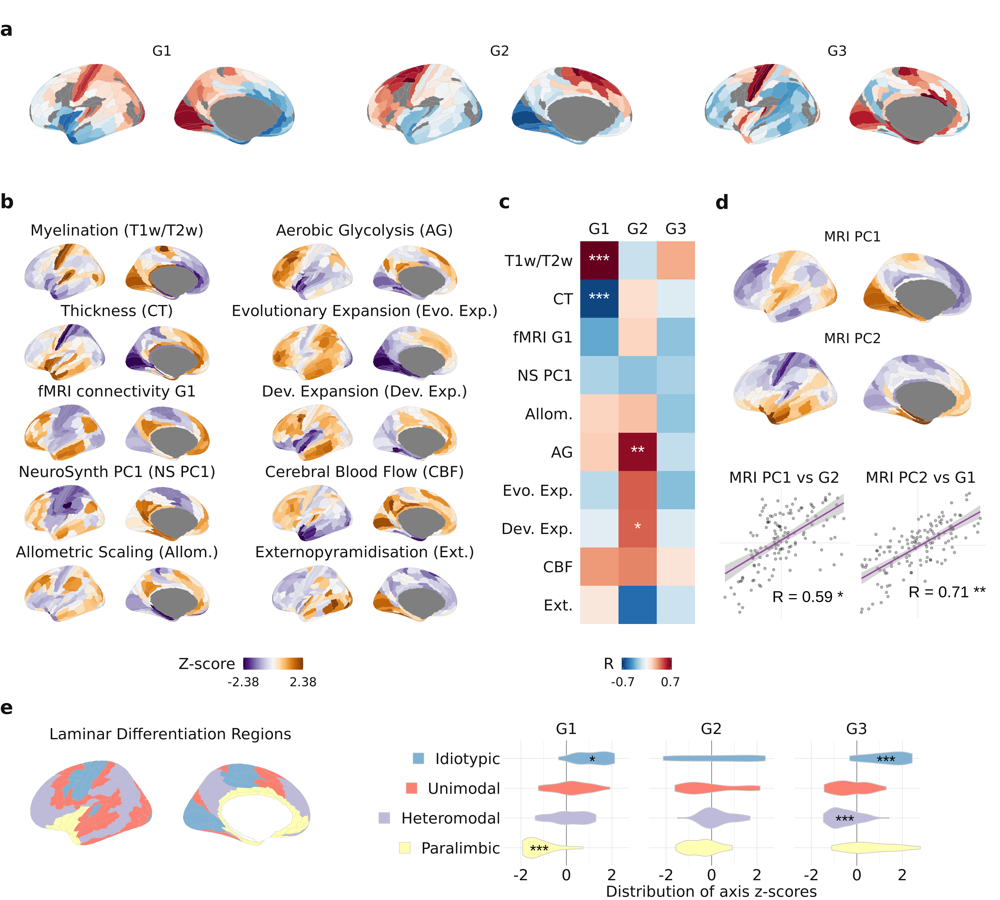

In [2179]:
%%R -w 20 -h 18 --units in -r 200 -i hcp_scores -i maps_rename -i null_p_rename -i pca_weights -i pca_scores -i ahba_scores -i maps_pca_scatter -i maps_pca_corrs -i mesulam_ve_yeo -i mesulam_scores_sig
source("../code/plot_maps.R")
source("../code/Rplots.R")

g1 <- plot_hcp_wide(hcp_scores) + guides(fill='none') + theme(legend.margin=margin(t = -40, unit='pt'),
                                                              plot.tag.position = c(0, .95))
g2 <- plot_maps(maps_rename, ncol=2, colors=rev(brewer.puor(100)), spacing=0) + theme(
            legend.position='bottom',
            # legend.margin=margin(t = -60, unit='pt'),
            panel.spacing.x = unit(4, 'lines'),
            plot.tag.position = c(0, .95))
g3 <- plot_map_corrs(null_p_rename, size=9) + theme(
            # legend.margin=margin(t = -60, unit='pt'),
            plot.tag.position = c(0.1, .95)) & theme(axis.text=element_text(size=22))
g4 <- plot_ahba_mri_brains(pca_scores, colors=brewer.puor(100), ncol=1) + theme(plot.tag.position = c(0,.9))
g5 <- plot_maps_pca_scatter(maps_pca_scatter, maps_pca_corrs, size=8, ncol=2, x=1, y=-2) + plot_layout(tag_level='new')

g6 = plot_hcp_classes(mesulam_ve_yeo, classes=Mesulam, classcolors=Mesulam_colors, classnames=Mesulam_names, ncol=4) +
    ggtitle('Laminar Differentiation Regions') + 
    theme(legend.position='none', 
          plot.title=element_text(hjust=0.5, size=22, color='grey7', family='Calibri',margin=margin(b=-50)),
          )
g6b = plot_atlas_violins(mesulam_ve_yeo, mesulam_scores_sig) + plot_layout(tag_level='new') +
    theme(strip.text=element_text(size=22, color='grey7', family='Calibri'))

layout <- c(
  # Axes
  area(t = 1, b = 9, l = 1, r = 48),    
  # All maps
  area(t = 10, b = 38, l = 1, r = 22),
  # All corrs
  area(t = 10, b = 38, l = 23, r = 31),
  # PCA brains
  area(t = 10, b = 25, l = 32, r = 48),
  # PCA-AHBA scatter
  area(t = 27, b = 38, l = 32, r = 48),
  # Mesulam brains
  area(t = 39, b = 48, l = 1, r = 20),
  # # Mesulam enrichments
  area(t = 39, b = 48, l = 21, r = 48)

)

# plot <- g1 + g2 + g3 + g4 + g5 + plot_layout(design=layout)
plot <- g1 + g2 + g3 + g4 + g5 + g6 + g6b + plot_layout(design=layout)

(plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    # legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=0, l=0, "pt"),
    # plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0, vjust=1)
)) + plot_annotation(tag_level='a')

---

# Fig 4

### Brainchart disorder maps

In [1052]:
brainchart_maps = get_disorder_maps().loc[:,['ASD','MDD','SCZ']].apply(lambda x: (x-np.mean(x))/np.std(x))
# brainchart_maps_plot = brainchart_maps.apply(lambda x: (x-np.mean(x))/np.std(x))

In [1055]:
brainchart_maps.describe()

,ASD,MDD,SCZ
count,3.400000e+01,3.400000e+01,3.400000e+01
mean,9.632817e-17,6.040919e-16,-3.526591e-16
std,1.015038e+00,1.015038e+00,1.015038e+00
min,-1.870202e+00,-2.149466e+00,-1.750921e+00
25%,-5.281816e-01,-5.462080e-01,-6.285224e-01
50%,-7.161784e-02,-1.178866e-02,-7.174201e-02
75%,5.924749e-01,3.890258e-01,6.971452e-01
max,2.391059e+00,2.660308e+00,2.455864e+00


In [1056]:
dk_scores = dm_hcp_3d_ds5.score_in_dk()
# dk_scores = dm_hcp_ds8.score_in_dk()

### Brainchart disorder heatmap

In [1002]:
# dk_null_grads = np.load(f"../outputs/permutations/hcp_3d_ds5_spin_5000_in_dk.npy")
dk_null_grads = np.load(f"../outputs/permutations/spin_dk_5000_dm_hcp_3d_ds5_vertices.npy")

In [1003]:
corrs = get_corrs(dk_scores, brainchart_maps, method='pearson')
brainchart_null_p = corr_nulls_from_grads(dk_null_grads, dk_scores, brainchart_maps, method='pearsonr')

### Brainchart disorder scatters

In [1004]:
brainchart_scatter = (brainchart_maps
                .melt(ignore_index=False, var_name='map', value_name='map_score')
                .join(dk_scores.set_index('label')).reset_index()
                .set_index(['label','map','map_score'])
                .melt(ignore_index=False, var_name='G',value_name='G_score')
                .reset_index()
               )

brainchart_scatter_corrs = brainchart_null_p.loc[:,['map','G','r','q']]

In [1005]:
%%R -w 20 -h 8 --units in -r 100 -i brainchart_maps -i dk_scores -i brainchart_null_p -i brainchart_scatter -i brainchart_scatter_corrs
source("../code/plot_maps.R")
source("../code/brainPlots.R")

g1a <- plot_maps_dk(brainchart_maps, ncol=1)
g1b <- plot_dk(dk_scores, facet='w')

g2a <- plot_maps_scatter(brainchart_scatter %>% filter(map=='ASD', G=='G1'), brainchart_scatter_corrs %>% filter(map=='ASD', G=='G1'), x=.5, y=-1.5, facet=F)
g2b <- plot_maps_scatter(brainchart_scatter %>% filter(map=='ASD', G=='G2'), brainchart_scatter_corrs %>% filter(map=='ASD', G=='G2'), x=.5, y=-1.5, facet=F) #+ plot_layout(tag_level='new')
g2c <- plot_maps_scatter(brainchart_scatter %>% filter(map=='SCZ', G=='G3'), brainchart_scatter_corrs %>% filter(map=='SCZ', G=='G3'), x=.5, y=-1.5, facet=F) #+ plot_layout(tag_level='new')
g3 <- plot_map_corrs(brainchart_null_p, size=6.5) #+ plot_layout(tag_level='new')


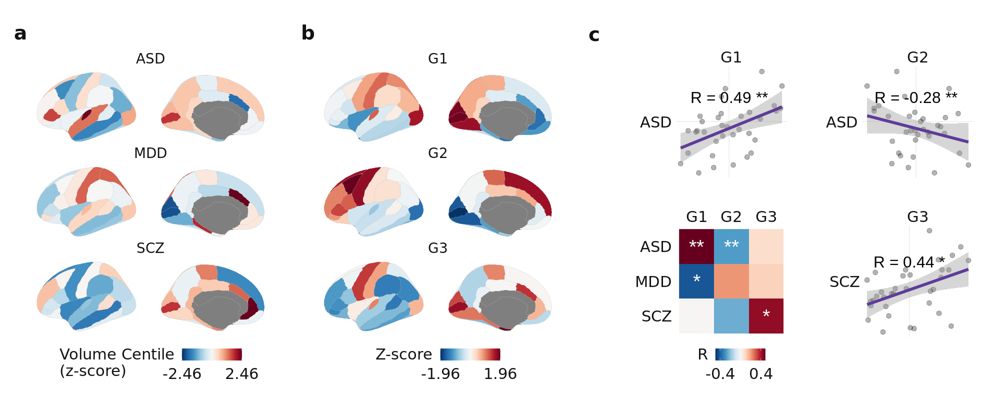

In [1934]:
%%R -w 20 -h 8 --units in -r 100 -i brainchart_maps -i dk_scores -i brainchart_null_p -i brainchart_scatter -i brainchart_scatter_corrs
source("../code/plot_maps.R")
source("../code/brainPlots.R")

g1a <- plot_maps_dk(brainchart_maps, ncol=1, name='Volume Centile\n(z-score)') + theme(plot.tag.position=c(0,.95))
g1b <- plot_maps_dk(dk_scores %>% remove_rownames() %>% column_to_rownames('label'), ncol=1) + theme(plot.tag.position=c(0,.95))

g2a <- plot_maps_scatter(brainchart_scatter %>% filter(map=='ASD', G=='G1'), brainchart_scatter_corrs %>% filter(map=='ASD', G=='G1'), 
                         x=0, y=1, facet=F, xlab='G1', ylab='ASD') + theme(plot.tag.position=c(0,.88))
g2b <- plot_maps_scatter(brainchart_scatter %>% filter(map=='ASD', G=='G2'), brainchart_scatter_corrs %>% filter(map=='ASD', G=='G2'), 
                         x=0, y=1, facet=F, xlab='G2', ylab='ASD') + plot_layout(tag_level='new')
g2c <- plot_maps_scatter(brainchart_scatter %>% filter(map=='SCZ', G=='G3'), brainchart_scatter_corrs %>% filter(map=='SCZ', G=='G3'), 
                         x=0, y=-2, facet=F, xlab='G3', ylab='SCZ') + plot_layout(tag_level='new')
g3 <- plot_map_corrs(brainchart_null_p, size=10) + plot_layout(tag_level='new')

g4 <- plot_spacer()

layout <- c(
    area(t=1,b=48,l=1,r=16),
    area(t=1,b=48,l=17,r=32),    
    
    area(t=1,b=24,l=33,r=40),
    area(t=1,b=24,l=41,r=48),
    area(t=25,b=48,l=41,r=48),
    
    area(t=25,b=48,l=33,r=40)
)

plot <- g1a + g1b + g2a + g2b + g2c + g3 + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    # plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)
# themed

plot1 <- themed + plot_annotation(tag_level='a')
plot1

In [74]:
brainchart_null_p

,G,map,r,p,q
0,G1,ASD,0.489569,0.000200,0.001800
1,G1,MDD,-0.419636,0.010998,0.024745
2,G1,SCZ,0.003580,0.991202,0.991202
3,G2,ASD,-0.276638,0.000600,0.002699
4,G2,MDD,0.217355,0.267347,0.481224
5,G2,SCZ,-0.242215,0.575285,0.778730
6,G3,ASD,0.086508,0.740252,0.832783
7,G3,MDD,0.111714,0.605679,0.778730
8,G3,SCZ,0.435319,0.007798,0.023395


In [2147]:
disgenet_genes = get_disgenet_genes()
disgenet_stats = compute_null_p(*compute_enrichments(weights, nulls, disgenet_genes))
disgenet_stats

,label,G,pct,true_mean,null_mean,null_std,z,pos,p,q,sig
0,ASD,G1,0.0848,-0.058917,-0.000536,0.042993,-1.357908,False,0.1696,0.298800,False
1,ASD,G2,0.0008,-0.132464,-0.000445,0.042517,-3.105111,False,0.0016,0.014400,True
2,ASD,G3,0.0024,-0.114502,-0.000044,0.041648,-2.748217,False,0.0048,0.021600,True
3,MDD,G1,0.0846,-0.057097,0.000276,0.041006,-1.399114,False,0.1692,0.298800,False
4,MDD,G2,0.1850,-0.037326,-0.000452,0.041595,-0.886517,False,0.3700,0.475714,False
5,MDD,G3,0.0996,-0.051814,-0.000267,0.040847,-1.261955,False,0.1992,0.298800,False
6,SCZ,G1,0.2978,-0.013602,-0.000240,0.025537,-0.523237,False,0.5956,0.595600,False
7,SCZ,G2,0.7610,0.018235,0.000102,0.025711,0.705253,True,0.4780,0.537750,False
8,SCZ,G3,0.0454,-0.043585,0.000208,0.025755,-1.700375,False,0.0908,0.272400,False


### SCZ supragranular

In [1812]:
hcp_scores = dm_hcp_3d_ds5.clean_scores()

In [1813]:
import nibabel as nib
from neuromaps.nulls.spins import parcels_to_vertices, vertices_to_parcels
scz_diff_img = nib.load('../data/lh.GyralSulcalDifferences.mgh')
hcp_img = annot_to_gifti('../data/parcellations/lh.HCPMMP1.annot')
scz_diff_hcp = vertices_to_parcels(scz_diff_img.get_fdata(), hcp_img)

In [1834]:
scz_diff = get_labels_hcp()[:180].to_frame().assign(SCZ_supragranular = scz_diff_hcp).set_index('label').apply(lambda x: (x-np.mean(x))/np.std(x))
scz_diff_scatter = scz_diff \
    .join(hcp_scores.set_index('label')).reset_index() \
    .melt(id_vars=['label','SCZ_supragranular'], var_name='G', value_name='G_score') \
    .rename({'SCZ_supragranular':'map_score'}, axis=1).assign(map='SCZ_supragranular')

In [1815]:
nulls = np.load('../outputs/permutations/hcp_3d_ds5_spin_5000.npy')
null_corrs = corr_nulls_from_grads(nulls, hcp_scores, scz_diff)
scz_diff_corrs = null_corrs.reset_index().rename({'level_0':'G', 'level_1':'map'}, axis=1)

In [1816]:
scz_diff_corrs

,index,G,map,r,p,q
0,0,G1,SCZ_supragranular,-0.130693,0.765847,0.765847
1,1,G2,SCZ_supragranular,0.148474,0.757848,0.765847
2,2,G3,SCZ_supragranular,0.552235,0.001400,0.004199


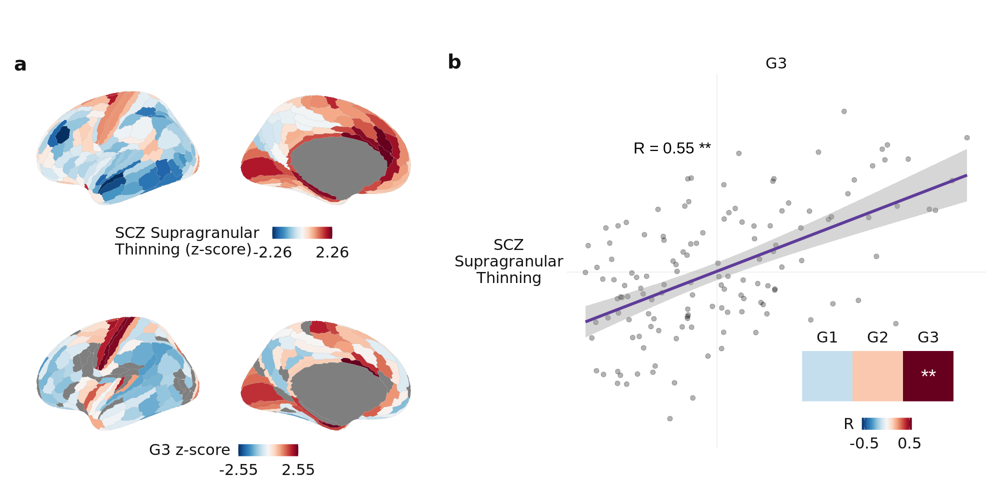

In [1943]:
%%R -w 20 -h 10 --units in -r 100 -i scz_diff -i hcp_scores -i scz_diff_scatter -i scz_diff_corrs
source("../code/Rplots.R")
source("../code/plot_maps.R")

g2 = plot_maps(scz_diff, name='SCZ Supragranular \nThinning (z-score)') + 
        theme(strip.text.x=element_blank(), plot.tag.position=c(0,.8))
g2b = plot_hcp(hcp_scores %>% select(label,G3), name='G3 z-score') + 
    theme(strip.text=element_blank(), plot.tag.position=c(0,.9)) + plot_layout(tag_level='new')
g2c = plot_maps_scatter(scz_diff_scatter %>% filter(G=='G3') %>% mutate(map='SCZ\nSupragranular\nThinning'), 
                        scz_diff_corrs %>% filter(G=='G3') %>% mutate(map='SCZ\nSupragranular\nThinning'), 
                        facet='v', switch='y', y=2, x=-.5, aspect=NULL, pointsize=3, size=8) + 
    theme(strip.text.y.left=element_text(size=22, color='grey7', family='Calibri'),
          strip.text.x=element_text(size=22, color='grey7', family='Calibri'),
          plot.tag.position=c(0,.9)
        )
g2d = plot_map_corrs(scz_diff_corrs, size=10) + theme(axis.text.y=element_blank()) + plot_layout(tag_level='new')      

layout <- c(
    area(t=1,b=12,l=1,r=24),
    area(t=13,b=24,l=1,r=24),
    area(t=1,b=24,l=25, r=48)
)

plot <- g2 + g2b + g2c + inset_element(g2d, t=.4, b=0.05, l=.6, r=.95, align_to='full') + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    # plot.tag.position = c(0, .95),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

plot2 <- themed + plot_annotation(tag_level='a')
plot2

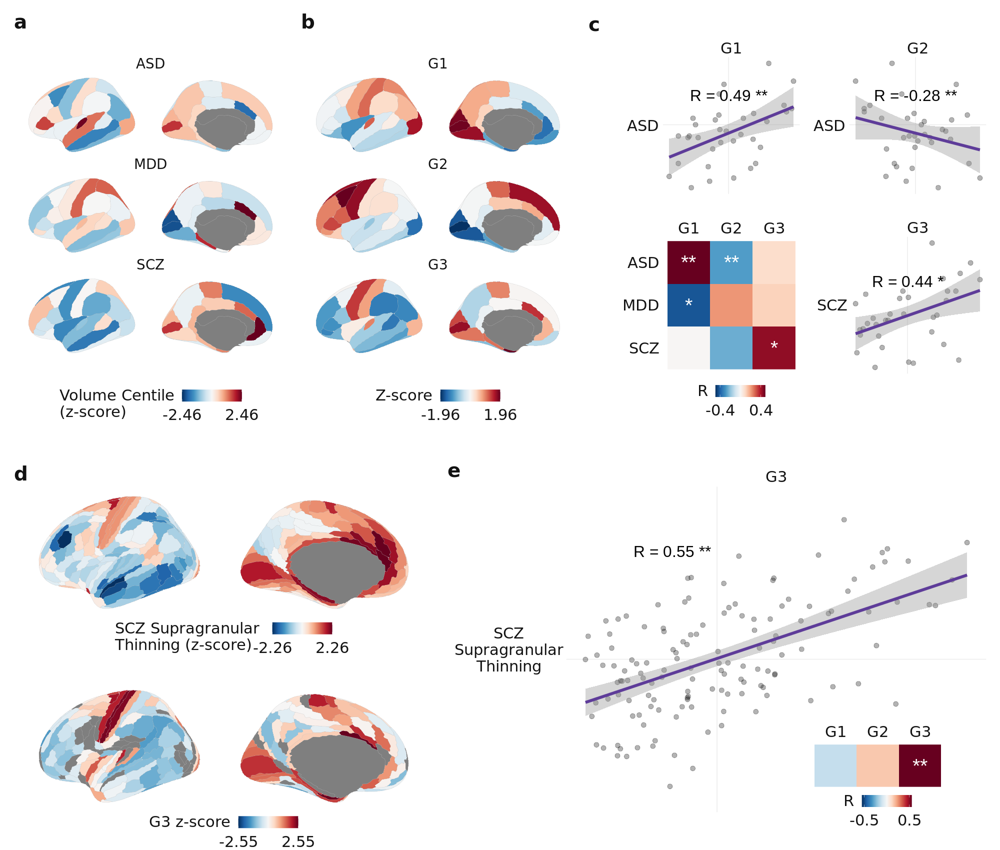

In [1944]:
%%R -w 20 -h 17 --units in -r 100
themed <- ((plot1 / plot2) + plot_layout(heights=c(5,5))) & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    # strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=0, r=10, b=0, l=10, "pt"),
    # plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

themed + plot_annotation(tag_level='a')

---

# Supplement

### Donor distribution

In [47]:
counts_hcp = pd.read_csv("../outputs/counts_hcp.csv", index_col=0)
# stability = pd.read_csv("../outputs/stability_hcp_ranked.csv", index_col=0).set_index('gene_symbol')
donor_counts = (counts_hcp!=0).sum(axis=1)[:180].rename('count').to_frame().join(get_labels_hcp()).set_index('label')

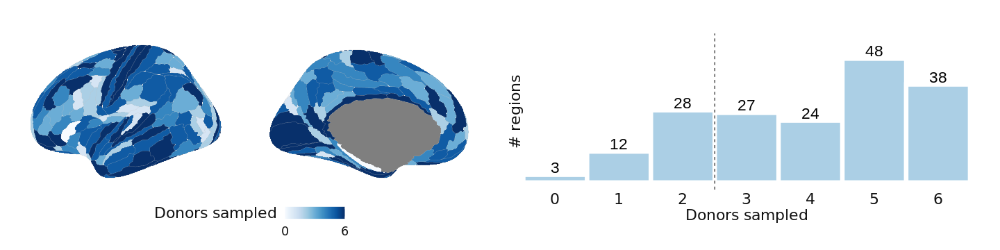

In [1785]:
%%R -i donor_counts -w 20 -h 5  --units in
source("../code/Rplots.R")
g1 = plot_maps(donor_counts, 
    colorscale='absolute', colors=brewer.blues(100), name='Donors sampled') + 
    theme(strip.text.x=element_blank(), legend.margin=margin(-30), legend.title=element_text(vjust=1))
g2 = plot_dist_donors_hcp(donor_counts)

(g1 | g2) & theme(
    text=element_text(size=22, color='grey7', family='Calibri')
    )

### Version scatter plots

In [1515]:
versions_scores = pd.concat({
   'pca_base' : pca_base.clean_scores(),
   'pca_3d_ds7' : pca_3d_ds7.clean_scores(),
   'dme_3d_ds5' : dme_3d_ds5.clean_scores(),
   'dme_ds8' : dme_ds8.clean_scores()
}).reset_index(level=0).rename({'level_0':'version'},axis=1)

scores_melt = (versions_scores
               .set_index(['version', 'label'])
               .melt(ignore_index=False, var_name='G', value_name='score')
               .reset_index('version')
)
df_versions_scatter = (scores_melt.join(scores_melt, lsuffix='_x', rsuffix='_y')
    .loc[lambda x: 
            (x['version_x'].str.contains('pca_3d_ds7')) & (x['version_y'].str.contains('ds5')) |
            (x['version_x'].str.contains('pca_3d_ds7')) & (x['version_y'].str.contains('ds8')) |
            (x['version_x'].str.contains('ds5')) & (x['version_y'].str.contains('ds8'))
    ]
    .assign(version_pair = lambda x: x['version_x']+'__'+x['version_y'])
)
df_versions_scatter.head()

,version_x,G_x,score_x,version_y,G_y,score_y,version_pair
label,,,,,,,
1,pca_3d_ds7,G1,1.511613,dme_3d_ds5,G1,1.458682,pca_3d_ds7__dme_3d_ds5
1,pca_3d_ds7,G1,1.511613,dme_ds8,G1,1.509932,pca_3d_ds7__dme_ds8
1,pca_3d_ds7,G1,1.511613,dme_3d_ds5,G2,0.537937,pca_3d_ds7__dme_3d_ds5
1,pca_3d_ds7,G1,1.511613,dme_ds8,G2,-0.101239,pca_3d_ds7__dme_ds8
1,pca_3d_ds7,G1,1.511613,dme_3d_ds5,G3,0.935684,pca_3d_ds7__dme_3d_ds5


`summarise()` has grouped output by 'G_x'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'G_x'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'G_x'. You can override using the `.groups` argument.


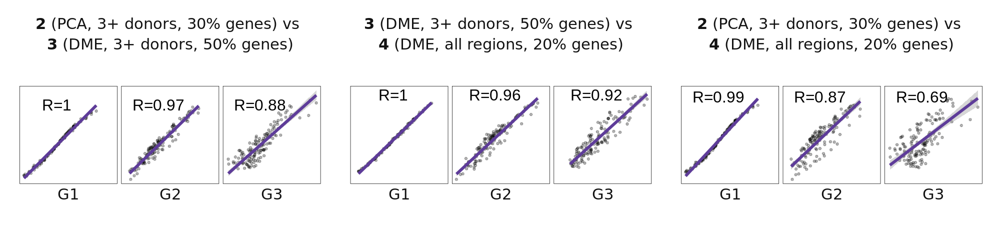

In [1798]:
%%R -w 20 -h 5 --units in -r 100 -i df_versions_scatter

plot_version_pair <- function(df, title, x=0, y=2.5,size=8) {
    r = df %>% group_by(G_x, G_y) %>% summarize(r=cor(score_x, score_y)) %>% 
    mutate(r_label=paste0('R=', round(r,2))) %>% filter(G_x==G_y)

    df %>%
    filter(G_x==G_y) %>%
    ggplot(aes(x=score_x, y=score_y)) + 
    facet_grid(~G_y, switch='x') + 
    geom_point(alpha=.3) +
    geom_smooth(method='lm', color=brewer.puor(5)[5], size=2, se=T) +
    geom_text(data=r, aes(label=r_label, x=x, y=y), size=size, hjust=0.5, vjust=0.5) +
    ggtitle(title) +
    theme_minimal() + 
    theme(panel.grid = element_blank(),
        text = element_text(size=22, color='grey7', family='Calibri'),
        strip.text.x = element_text(size=22, color='grey7', family='Calibri', angle=0),
        strip.text.y = element_blank(),
        # strip.text.y = element_text(size=22, color='grey7', family='Calibri', angle=0),
        axis.text = element_blank(), axis.title = element_blank(),
        panel.border=element_rect(fill='transparent'),
        plot.title=element_text(size=22, color='grey7', family='Calibri', hjust=.5),
        aspect.ratio=1,
        plot.margin=margin(l=20,r=20,b=20,t=20)
)
}

g1 = df_versions_scatter %>% filter(version_pair == 'pca_3d_ds7__dme_3d_ds5') %>% 
    plot_version_pair(title=expression(atop(bold('2') * ' (PCA, 3+ donors, 30% genes) vs ', 
                                             bold('3') * ' (DME, 3+ donors, 50% genes)')))
g2 = df_versions_scatter %>% filter(version_pair == 'dme_3d_ds5__dme_ds8') %>% 
    plot_version_pair(title=expression(atop(bold('3') * ' (DME, 3+ donors, 50% genes) vs ', 
                                             bold('4') * ' (DME, all regions, 20% genes)')))                                             
g3 = df_versions_scatter %>% filter(version_pair == 'pca_3d_ds7__dme_ds8') %>% 
    plot_version_pair(title=expression(atop(bold('2') * ' (PCA, 3+ donors, 30% genes) vs ', 
                                             bold('4') * ' (DME, all regions, 20% genes)')))


g1 + g2+ g3

### Parameter choices

In [1348]:
# Define variations of processing parameters to test
variations = {
    # 'gene_stability_threshold': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9],
    # 'donors_threshold': [3,2,1],
    # 'lr_mirror': [None],
    # 'ibf_threshold': [0.0, 0.2, 0.5, 0.8],
    # 'tolerance': [0,4],
    # 'sim_threshold': [2],
    # 'agg_metric': ['median'],
    'sample_norm': [None, 'center', 'zscore', 'rs'],
    'gene_norm': [None, 'center', 'zscore', 'rs'],
    # 'probe_selection': ['max_intensity', 'mean', 'rnaseq']
}
defaults = {
    'gene_stability_threshold': 0.5,
    'donors_threshold': 3,
    'lr_mirror': 'rightleft',
    'ibf_threshold': 0.5,
    'tolerance': 2,
    'probe_selection': 'diff_stability',
    'sim_threshold': None,
    'agg_metric': 'mean',
    'sample_norm': 'srs',
    'gene_norm': 'srs'
}

# Reset if desired
# robustness_data = {}
robustness_data = robustness_data_3d_ds5

# Process data with one parameter varied, and save
for parameter, values in variations.items():
    print(f'--- Processing values of {parameter} ---')
    robustness_data[parameter] = {}
    for v in values:
        # Reset kwargs to default values
        kwargs = defaults.copy()
        # Update one value
        kwargs[parameter]=v
        exp = get_expression_abagen(fetch_hcp(), **kwargs)
        robustness_data[parameter][v] = exp
        print(f'Done {parameter}={v}')

# # For each parameter, insert the default data as base
# for parameter, default_value in defaults.items():
#     robustness_data[parameter][default_value] = base

--- Processing values of sample_norm ---
7973 genes remain               after filtering for top 0.5 stability
Done sample_norm=None
7973 genes remain               after filtering for top 0.5 stability
Done sample_norm=center
7973 genes remain               after filtering for top 0.5 stability
Done sample_norm=zscore
7973 genes remain               after filtering for top 0.5 stability
Done sample_norm=rs
--- Processing values of gene_norm ---
7973 genes remain               after filtering for top 0.5 stability
Done gene_norm=None
7973 genes remain               after filtering for top 0.5 stability
Done gene_norm=center
7973 genes remain               after filtering for top 0.5 stability
Done gene_norm=zscore
7973 genes remain               after filtering for top 0.5 stability
Done gene_norm=rs


In [1349]:
# save_pickle(robustness_data, 'robustness_data_base')
# save_pickle(robustness_data, 'robustness_data_3d_ds8')
save_pickle(robustness_data, 'robustness_data_3d_ds5')
# save_pickle(robustness_data, 'robustness_data_ds8')
# robustness_data_base = load_pickle('robustness_data_base')
# robustness_data_3d_ds8 = load_pickle('robustness_data_3d_ds8')
robustness_data_3d_ds5 = load_pickle('robustness_data_3d_ds5')
# robustness_data_ds8 = load_pickle('robustness_data_ds8')

In [1350]:
def get_robustness_corrs(base_model, robustness_data=robustness_data, approach='pca', test_dme_robustness=False):
    robustness_corrs = {}
    for parameter, values in robustness_data.items():
        robustness_corrs[parameter] = {}
        for value, data in values.items():
            name_to_print = f'{parameter}:{value}'
            model = gradientVersion(approach=approach).fit(data, name=name_to_print)
            # corrs = model.corr_scores(base_model, match=True)['corr']
            corrs = pd.Series(np.diag(model.corr_scores(base_model, match=False)))
            robustness_corrs[parameter][value] = np.abs(corrs)
    
    # test base model against variations of DME parameters
    if test_dme_robustness:
        robustness_corrs['alpha'] = {}
        for alpha in [0,0.5]:
            name_to_print = f'alpha:{alpha}'
            data = base_model.expression
            model = gradientVersion(approach=approach, alpha=alpha).fit(data, name=name_to_print)
            corrs = pd.Series(np.diag(model.corr_scores(base_model, match=False)))
            robustness_corrs['alpha'][alpha] = np.abs(corrs)

        robustness_corrs['kernel'] = {}
        for kernel in ['gaussian', 'cosine', 'pearson']:
            name_to_print = f'kernel:{kernel}'
            data = base_model.expression
            model = gradientVersion(approach=approach, kernel=kernel).fit(data, name=name_to_print)
            corrs = pd.Series(np.diag(model.corr_scores(base_model, match=False)))
            robustness_corrs['kernel'][kernel] = np.abs(corrs)
            
    return robustness_corrs

In [1332]:
# get_expression_abagen(atlas=fetch_hcp(), gene_stability_threshold=0.8, save_name='hcp_ds8')
dm_hcp_ds8 = gradientVersion().fit('hcp_ds8')

New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=hcp_ds8


In [1324]:
pca_hcp_base = gradientVersion(approach='pca').fit(get_expression_abagen(atlas=fetch_hcp()))

New gradients version: method=pca, kernel=None, sparsity=0, data=


In [1351]:
robustness_corrs = {
    # 'pca_hcp_base': get_robustness_corrs(pca_hcp_base, robustness_data_base, approach='pca'),
    'pca_hcp_3d_ds8': get_robustness_corrs(pca_hcp_3d_ds8, robustness_data_3d_ds8, approach='pca'),
    'dm_hcp_3d_ds5': get_robustness_corrs(dm_hcp_3d_ds5, robustness_data_3d_ds5, approach='dm', test_dme_robustness=True),
    'dm_hcp_ds8': get_robustness_corrs(dm_hcp_ds8, robustness_data_ds8, approach='dm', test_dme_robustness=True)
}

New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.0
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.1
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.2
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.3
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.4
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.5
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.6
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.7
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.8
New gradients version: method=pca, kernel=None, sparsity=0, data=gene_stability_threshold:0.9
New gradients version: method=pca, kernel=None, sparsity=0, 

In [1352]:
robustness = {}
for version_name, version_corrs in robustness_corrs.items():
    version_dict = {param:pd.concat(value_corrs) for param, value_corrs in version_corrs.items()}
    robustness[version_name] = pd.concat(version_dict)
robustness = (pd.concat(robustness)
  .reset_index()
  .set_axis(['version','parameter', 'value', 'G', 'corr'], axis=1)
  .assign(value = lambda x: x['value'].astype('str'))
)
robustness

,version,parameter,value,G,corr
0,pca_hcp_3d_ds8,gene_stability_threshold,0.0,0,0.995165
1,pca_hcp_3d_ds8,gene_stability_threshold,0.0,1,0.847612
2,pca_hcp_3d_ds8,gene_stability_threshold,0.0,2,0.197083
3,pca_hcp_3d_ds8,gene_stability_threshold,0.0,3,0.082761
4,pca_hcp_3d_ds8,gene_stability_threshold,0.0,4,0.182883
...,...,...,...,...,...
540,dm_hcp_ds8,kernel,pearson,0,0.941311
541,dm_hcp_ds8,kernel,pearson,1,0.877053
542,dm_hcp_ds8,kernel,pearson,2,0.795657
543,dm_hcp_ds8,kernel,pearson,3,0.679419


In [1959]:
# Remove identity rows
# drops = [
#   ('pca_hcp_3d_ds8','gene_stability_threshold',0.8),
#   ('dm_hcp_3d_ds5','gene_stability_threshold',0.5),
#   ('dm_hcp_ds8','gene_stability_threshold',0.8),
#   ('pca_hcp_3d_ds8','donors_threshold',3),
#   ('dm_hcp_3d_ds5','donors_threshold',3),
#   ('dm_hcp_ds8','donors_threshold',1)
# ]

robustness = {}
for version_name, version_corrs in robustness_corrs.items():
    version_dict = {param:pd.concat(value_corrs) for param, value_corrs in version_corrs.items()}
    robustness[version_name] = pd.concat(version_dict)
robustness = (pd.concat(robustness)
  # .drop(index=drops)
  .reset_index()
  .set_axis(['version','parameter', 'value', 'G', 'corr'], axis=1)
  .assign(value = lambda x: x['value'].astype('str'))
)
# robustness



# Replace names of some value parameters for plot
robustness['value'] = robustness['value'].replace({'nan':'none',})
robustness.loc[lambda x: x['parameter']=='gene_stability_threshold', 'value'] = \
  robustness.loc[lambda x: x['parameter']=='gene_stability_threshold', 'value'] \
  .apply(lambda ds: f'top {100-round(float(ds)*100)}%').replace({'top 100%':'all genes'})

robustness.loc[lambda x: x['parameter']=='donors_threshold', 'value'] = \
  robustness.loc[lambda x: x['parameter']=='donors_threshold', 'value'] \
  .replace({'1':'all regions', '2': '2+ donors', '3': '3+ donors'})

# Replace parameter names for plot
parameter_names = {
    'gene_stability_threshold': 'Differential stability\ngene filter',
    'donors_threshold': 'Donors/region filter',
    'lr_mirror': 'Right hemi samples\nDefault: mirror',
    'ibf_threshold': 'Gene intensity filter\nDefault: 0.5',
    'sim_threshold': 'Probe similarity threshold\nDefault: none',
    'probe_selection': 'Probe-to-gene selection\nDefault: differential stability',
    'tolerance': 'Sample-to-region \nmatching tolerance\nDefault: 2',
    'agg_metric': 'Sample-to-region aggregation\nDefault: mean',
    'sample_norm': 'Sample normalization\nDefault: scaled robust sigmoid',
    'gene_norm': 'Gene normalization\nDefault: scaled robust sigmoid',
    'kernel': 'DME kernel parameter\nDefault: normalized cosine',
    'alpha': 'DME alpha parameter\nDefault: 1',
}
robustness['parameter'] = pd.Categorical(robustness['parameter'].map(parameter_names),
                          categories=parameter_names.values(), ordered=True)

# Replace version names for plot
version_names = {
    'pca_hcp_base': 'PCA, all genes,\nall regions',
    'pca_hcp_3d_ds8': 'PCA, 20% genes,\n3+ donor regions',
    'dm_hcp_3d_ds5': 'DME, 50% genes,\n3+ donor regions',
    'dm_hcp_ds8': 'DME, 20% genes,\nall regions'
}
robustness['version'] = robustness['version'].map(version_names)
robustness['value'] = pd.Categorical(robustness['value'], 
                      categories=robustness['value'].unique(), ordered=True)
robustness = robustness.sort_values(['parameter', 'value'])

# Identify self rows
robustness['self'] = False
robustness.loc[lambda x: (x['version'].str.contains('PCA')) & 
                         (x['parameter'].str.contains('gene filter')) & 
                         (x['value'].str.contains('top 20%')),
               'self'] = True
robustness.loc[lambda x: (x['version'].str.contains('DME, 50%')) & 
                         (x['parameter'].str.contains('gene filter')) & 
                         (x['value'].str.contains('top 50%')),
               'self'] = True
robustness.loc[lambda x: (x['version'].str.contains('DME, 20%')) & 
                         (x['parameter'].str.contains('gene filter')) & 
                         (x['value'].str.contains('top 20%')),
               'self'] = True
robustness.loc[lambda x: (x['version'].str.contains('PCA')) & 
                         (x['parameter'].str.contains('Donors/region')) & 
                         (x['value'].str.contains('3+')),
               'self'] = True
robustness.loc[lambda x: (x['version'].str.contains('DME, 50%')) & 
                         (x['parameter'].str.contains('Donors/region')) & 
                         (x['value'].str.contains('3+')),
               'self'] = True
robustness.loc[lambda x: (x['version'].str.contains('DME, 20%')) & 
                         (x['parameter'].str.contains('Donors/region')) & 
                         (x['value'].str.contains('all regions')),
               'self'] = True

robustness

,version,parameter,value,G,corr,self
0,"PCA, 20% genes,\n3+ donor regions",Differential stability\ngene filter,all genes,0,0.995165,False
1,"PCA, 20% genes,\n3+ donor regions",Differential stability\ngene filter,all genes,1,0.847612,False
2,"PCA, 20% genes,\n3+ donor regions",Differential stability\ngene filter,all genes,2,0.197083,False
3,"PCA, 20% genes,\n3+ donor regions",Differential stability\ngene filter,all genes,3,0.082761,False
4,"PCA, 20% genes,\n3+ donor regions",Differential stability\ngene filter,all genes,4,0.182883,False
...,...,...,...,...,...,...
525,"DME, 20% genes,\nall regions",DME alpha parameter\nDefault: 1,0.5,0,0.999997,False
526,"DME, 20% genes,\nall regions",DME alpha parameter\nDefault: 1,0.5,1,0.999745,False
527,"DME, 20% genes,\nall regions",DME alpha parameter\nDefault: 1,0.5,2,0.999742,False
528,"DME, 20% genes,\nall regions",DME alpha parameter\nDefault: 1,0.5,3,0.999921,False


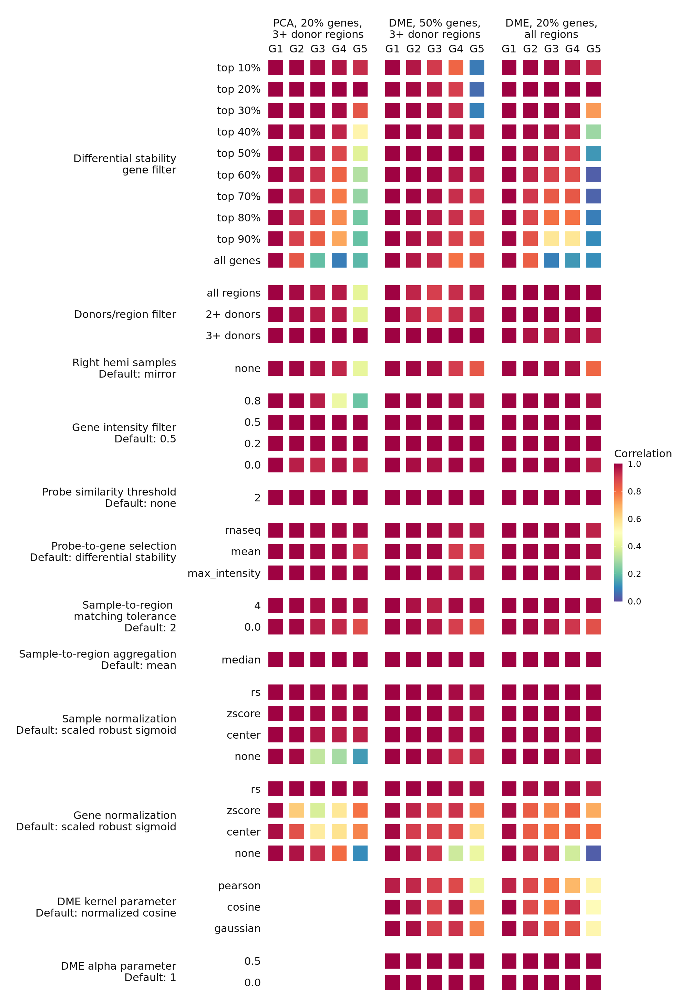

In [1960]:
%%R -w 20 -h 29 -r 100 --units in -i robustness
# robustness %>% filter(grepl('Gene', parameter))
robustness <- robustness %>%
mutate(version = factor(version, ordered=T, levels=unique(.$version))) %>%
mutate(parameter = factor(parameter, ordered=T, levels=unique(.$parameter))) %>%
mutate(value = factor(value, ordered=T, levels=unique(.$value))) %>%
mutate(G = factor(G, levels=c(0,1,2,3,4), labels=c('G1','G2','G3','G4','G5')))

robustness %>% 
ggplot(aes(x=G, y=value, fill=corr)) + 
facet_grid(parameter~version, scales='free_y', space='free', switch='y') + #, scales='free_x', switch='x') + 
geom_tile(aes(alpha=self), width=.7, height=.7) + #, color='grey50', size=.5) +
# geom_text(aes(label='★'), data=robustness %>% filter(corr>0.6), color='gray30', size=5) +
scale_alpha_manual(values=c(1,1), guide='none') +
scale_fill_gradientn(
        colors=rev(brewer.spectral(100)),
      #   colors=cubicl(100),
        limits=c(0,1.001), breaks=seq(0,1,.2),
        labels=c('0.0', '0.2', '0.4', '0.6', '0.8', '1.0'),
        name='Correlation'
) +
coord_cartesian(clip='off') +
scale_x_discrete(position='top') +
# guides(fill=guide_colorbar(barwidth=20)) +
guides(fill=guide_colorbar(barheight=20)) +
ylab('') + xlab('') +
theme_minimal() +
theme(text=element_text(size=22, family='Calibri', color='grey7'),
      axis.text=element_text(size=22, family='Calibri', color='grey7'),
      panel.grid=element_blank(),
      panel.spacing=unit(1,'lines'),
      legend.position='right',
      # legend.title=element_text(vjust=1),
      # axis.text.x=element_text(),
      strip.placement='outside',
      strip.text.x=element_text(size=22, family='Calibri', color='grey7'),
      strip.text.y.left=element_text(size=22, family='Calibri', color='grey7', 
                  angle=0, hjust=1, margin=margin(r=20)),
      plot.margin=margin(l=10,r=30,t=10,b=10)
)

### Raster plot of filtering options

In [137]:
triplets_pca = triplets_dict['PCA, all regions']
triplets_pca_3d = triplets_dict['PCA, only 3+ donor regions']
triplets_dm_3d = triplets_dict['DME, only 3+ donor regions']
triplets_dm = triplets_dict['DME, all regions']
triplets_pca_2d
triplets_dm_2d

,how,version,component,pair,corr,corr_abs
0,Region scores,0.0,1,012-345,0.885734,0.885734
1,Region scores,0.0,2,012-345,-0.020699,0.020699
2,Region scores,0.0,3,012-345,0.199682,0.199682
3,Region scores,0.0,4,012-345,-0.444058,0.444058
4,Region scores,0.0,5,012-345,0.030135,0.030135
...,...,...,...,...,...,...
495,Region scores,0.9,1,045-123,0.951041,0.951041
496,Region scores,0.9,2,045-123,0.894526,0.894526
497,Region scores,0.9,3,045-123,0.897265,0.897265
498,Region scores,0.9,4,045-123,-0.814028,0.814028


In [607]:
triplets_pca_by_donors = pd.concat({
    '1': triplets_pca,
    '2': triplets_pca_2d,
    '3': triplets_pca_3d,
})
triplets_dm_by_donors = pd.concat({
    '1': triplets_dm,
    '2': triplets_dm_2d,
    '3': triplets_dm_3d,
})

triplets_raster = (pd.concat({
    'pca': triplets_pca_by_donors, 
    'dm': triplets_dm_by_donors
}).reset_index([0,1])
.rename({
    'level_0':'method', 
    'level_1':'donors_filter',
    'version':'gene_filter'
}, axis=1)
.groupby(['component', 'method', 'donors_filter', 'gene_filter'])
.median()
.reset_index()
)

triplets_raster
save_pickle(triplets_raster, 'triplets_raster')

will replace the existing scale.



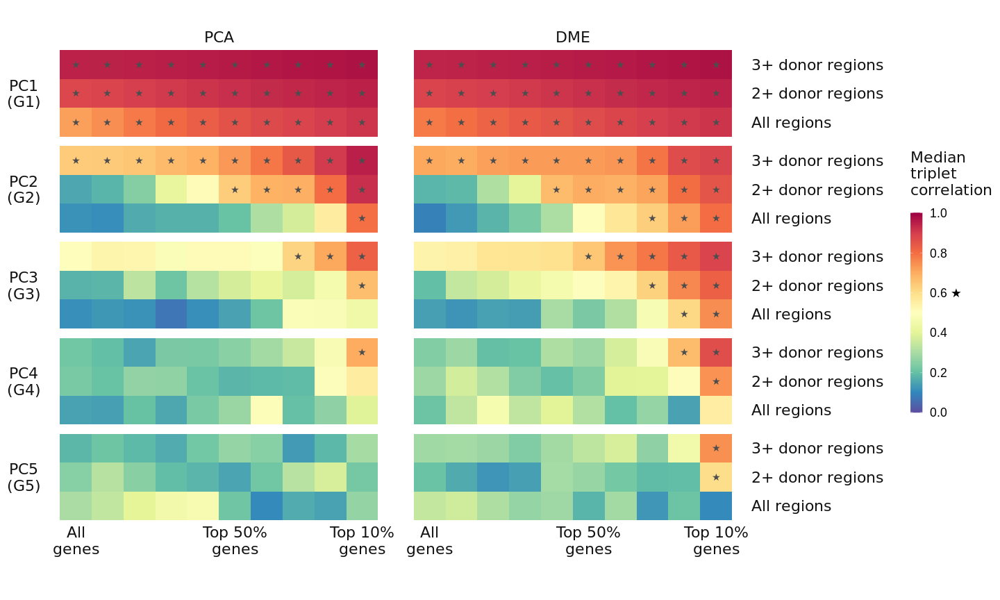

In [1769]:
%%R -w 20 -h 12 --units in -i triplets_raster
source("../code/Rplots.R")
plot_triplets_raster(triplets_raster, n_components=5, highlight='stars')

### Parcellation

In [1045]:
get_expression_abagen(fetch_schaefer(size=400), gene_stability_threshold=0.8, save_name='s400_ds8')

3190 genes remain               after filtering for top 0.2 stability


gene_symbol,A1BG,ABCA5,ABCA6,ABCA9,ABCC12,ABCC5,ABCC8,ABCG4,ABCG5,ABHD12,...,ZNRF1,ZPR1,ZRANB3,ZSCAN18,ZSCAN29,ZSCAN31,ZSCAN9,ZSWIM4,ZSWIM9,ZYX
label,,,,,,,,,,,,,,,,,,,,,
2,0.475877,0.648281,0.683120,0.591255,0.304834,0.762725,0.716932,0.654968,0.321188,0.719116,...,0.419797,0.251226,0.439890,0.279938,0.654725,0.735078,0.766394,0.699715,0.287828,0.704146
3,0.402134,0.667325,0.725160,0.703138,0.477643,0.695783,0.785770,0.663776,0.268297,0.623212,...,0.262812,0.309623,0.248355,0.341232,0.673178,0.641791,0.708107,0.626661,0.344903,0.741916
4,0.191526,0.673051,0.772590,0.696650,0.280423,0.621458,0.797977,0.598852,0.355796,0.537804,...,0.287615,0.201261,0.321973,0.161460,0.596003,0.738561,0.705432,0.665371,0.219011,0.747670
5,0.213300,0.844923,0.711770,0.777585,0.340540,0.893793,0.945879,0.768927,0.302349,0.516080,...,0.161435,0.122493,0.299885,0.107275,0.811046,0.647757,0.780779,0.885092,0.271830,0.911812
6,0.315628,0.532894,0.785290,0.621851,0.466099,0.668493,0.769439,0.648998,0.384216,0.587228,...,0.271288,0.465681,0.440820,0.283910,0.566545,0.697605,0.771910,0.553703,0.245335,0.855356
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
177,0.558225,0.419114,0.430208,0.453430,0.695559,0.465625,0.548204,0.449731,0.641915,0.536553,...,0.469362,0.521095,0.612274,0.596929,0.600004,0.547202,0.521786,0.451487,0.544554,0.506523
178,0.619044,0.388184,0.482562,0.332611,0.629395,0.391917,0.500509,0.480997,0.616417,0.548841,...,0.516796,0.570697,0.418840,0.421186,0.568355,0.191651,0.390995,0.550667,0.636919,0.520115
179,0.547336,0.443413,0.474370,0.517652,0.500566,0.188770,0.409415,0.374653,0.449119,0.404469,...,0.577631,0.568210,0.342349,0.272758,0.660582,0.239189,0.271496,0.536394,0.512113,0.401466


In [1046]:
dm_dk_ds8 = gradientVersion(approach='dm').fit('dk_ds8')
dm_dx_ds8 = gradientVersion(approach='dm').fit('dx_ds8')
dm_s400_ds8 = gradientVersion(approach='dm').fit('s400_ds8')

New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=dk_ds8
New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=dx_ds8
New gradients version: method=dm, kernel=normalized_angle, sparsity=0, data=s400_ds8


In [1047]:
hcp_scores = dm_hcp_ds8.clean_scores().assign(version='HCP-MMP1.0')
dk_scores = dm_dk_ds8.clean_scores().assign(version='Desikan-Killiany')
dx_scores = dm_dx_ds8.clean_scores().assign(version='Desterieux')
s400_scores = (dm_s400_ds8.scores
             .apply(lambda x: (x-np.mean(x))/np.std(x))
             .join(get_labels_schaefer(size=400))
             .assign(version='Schaefer-400')
            )

In [1048]:
corrs_dict = {
    'HCP-MMP1.0': correlate(dm_hcp_ds8.fit_weights(overwrite=False), dm_hcp_ds8.weights),
    'Desikan-Killiany': correlate(dm_dk_ds8.fit_weights(), dm_hcp_ds8.weights),
    'Desterieux': correlate(dm_dx_ds8.fit_weights(), dm_hcp_ds8.weights),    
    'Schaefer-400': correlate(dm_s400_ds8.fit_weights(), dm_hcp_ds8.weights)

}

weight_corrs = (pd.concat(corrs_dict)
 .melt(ignore_index=False)
 .reset_index()
 .set_axis(['version','x','y','corr'], axis=1)
 .loc[lambda x: (x['x'] < 3) & (x['y'] < 3)]
 .replace({'x':{0:'G1',1:'G2',2:'G3'}, 'y':{0:'G1',1:'G2',2:'G3'}})
)

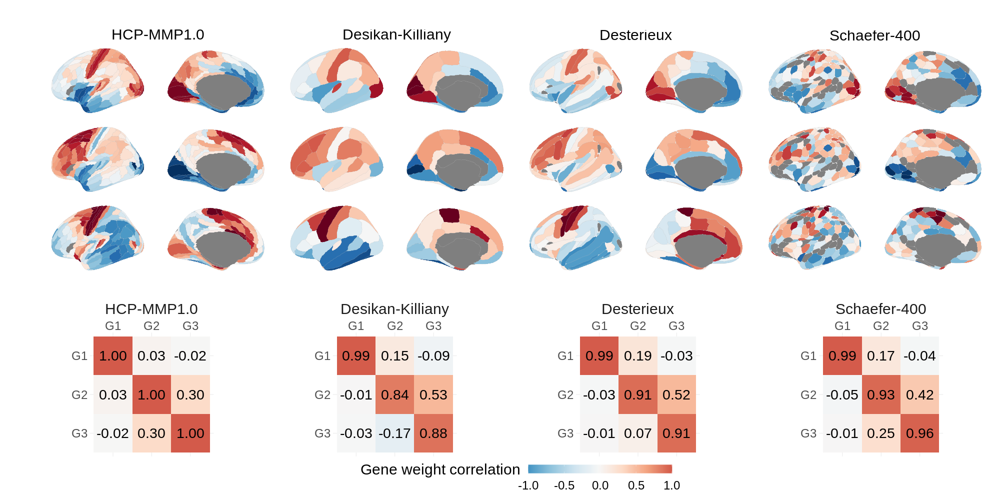

In [1049]:
%%R -w 2000 -h 1000 -i hcp_scores -i dk_scores -i dx_scores -i s400_scores -i weight_corrs 
source("../code/Rplots.R")
source("../code/brainPlots.R")

g1a <- plot_hcp(hcp_scores)
g1b <- plot_dk(dk_scores) + plot_layout(tag_level='new')
g1c <- plot_dx(dx_scores) + plot_layout(tag_level='new')
g1d <- plot_schaefer(s400_scores, size=400) + plot_layout(tag_level='new')

g2 <- plot_weight_corrs(weight_corrs, spacing=14, ylab='HCP-MMP1.0')


plot <- (
    ((g1a | g1b | g1c | g1d) & theme(legend.position='none', strip.text.y=element_blank())) /
    g2
) + plot_layout(heights=c(2,1))


themed <- plot & theme(
    text=element_text(size=30),
    legend.title=element_text(vjust=1),
    strip.text.x = element_text(size=30)
)
themed

### Burt single gene enrichments

In [1097]:
burt_genes = ['CORT','CALB1','SST','PVALB','CCK','NPY','PNOC','CALB2','VIP']
burt_genes = pd.DataFrame({'gene':burt_genes, 'label':burt_genes})
burt_stats = compute_null_p(*compute_enrichments(weights, nulls, burt_genes))

In [ ]:
layer_genes = get_layer_genes(which='maynard', add_hse_genes=False)
layer_stats = compute_null_p(*compute_enrichments(weights, nulls, layer_genes))

In [1113]:
grin_genes = ['GRIN' + x for x in ['3A','2B','2C','2A','A','1','3B','2D']]
gabra_genes = ['GABRA' + x for x in ['3','5','2','1','4']]
grin_gabra_genes = grin_genes + gabra_genes
grin_gabra_genes = pd.DataFrame({'gene':grin_gabra_genes, 'label':grin_gabra_genes})
grin_gabra_stats = compute_null_p(*compute_enrichments(weights, nulls, grin_gabra_genes))

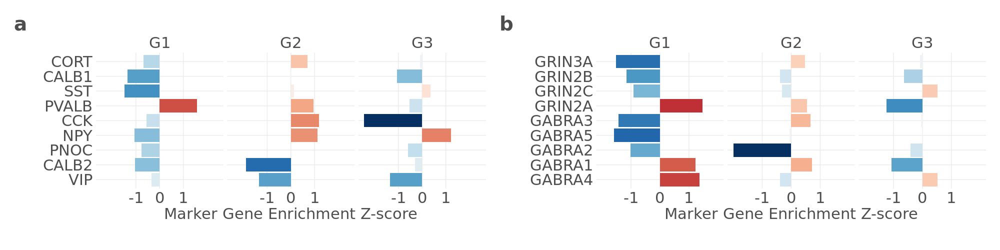

In [1128]:
%%R -i burt_stats -i grin_gabra_stats -w 20 -h 5 --units in -r 100
g1 = plot_enrichment_bars_z(burt_stats, xlab='Marker Gene Enrichment Z-score')
g2 = plot_enrichment_bars_z(grin_gabra_stats, xlab='Marker Gene Enrichment Z-score')

((g1 | g2) &theme(
  text=element_text(size=22, color='grey30', family='Calibri'), 
  axis.text=element_text(size=22, color='grey30', family='Calibri'),
  strip.text=element_text(size=22, color='grey30', family='Calibri'),
  legend.text=element_text(size=22, color='grey30', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=20, l=10, "pt"),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)) + plot_annotation(tag_level='a')

### Neuron subtype enrichments

In [1121]:
lake_subtypes = get_cell_genes(which='jakob', include='lake_plus_glia', subtype=True, combine_layers=False)
order = (lake_subtypes
         .assign(neuro = lambda x: [False if c in ['Endo', 'Oligo', 'Micro', 'OPC', 'Astro'] else True for c in x.label])
         .assign(ex_in = lambda x: [False if 'In' in c else True for c in x.label])
         .sort_values(['neuro', 'ex_in'], ascending=False).label.unique()
        )

lake_stats = compute_null_p(*compute_enrichments(weights, nulls, lake_subtypes), order=order)

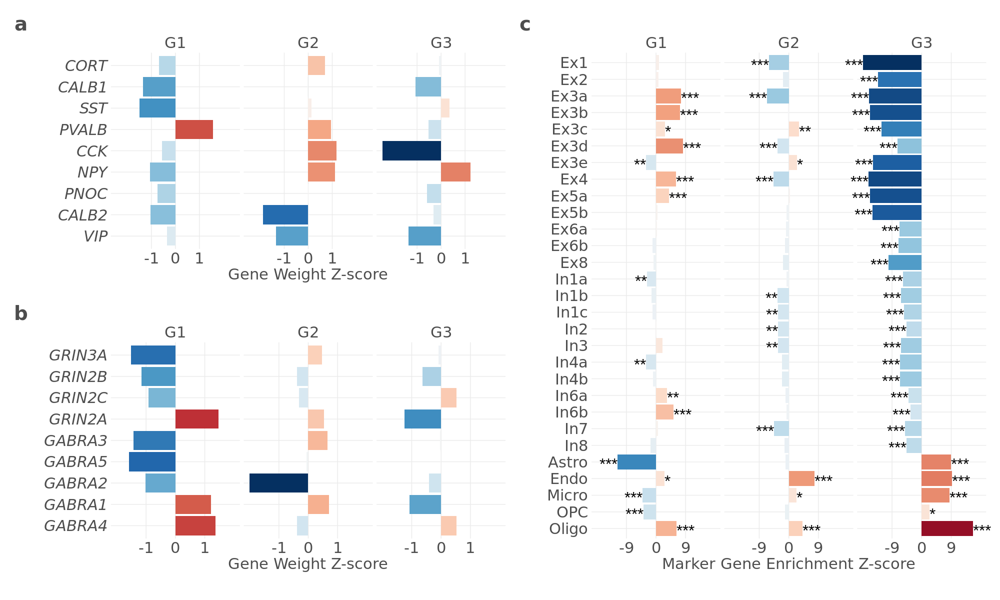

In [1134]:
%%R -i lake_stats -w 20 -h 12 --units in -r 100
g1 = plot_enrichment_bars_z(burt_stats, xlab='Gene Weight Z-score') + theme(axis.text.y=element_text(face='italic'))
g2 = plot_enrichment_bars_z(grin_gabra_stats, xlab='Gene Weight Z-score') + theme(axis.text.y=element_text(face='italic'))
g3 = plot_enrichment_bars_z(lake_stats, xlab='Marker Gene Enrichment Z-score') 

(((g1 / g2) | g3) & theme(
  text=element_text(size=22, color='grey30', family='Calibri'), 
  axis.text=element_text(size=22, color='grey30', family='Calibri'),
  strip.text=element_text(size=22, color='grey30', family='Calibri'),
  legend.text=element_text(size=22, color='grey30', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=20, l=10, "pt"),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)) + plot_annotation(tag_level='a')

### MRI PCA permutations 

In [1204]:
version = dm_hcp_3d_ds5
pca_scores, pca_var, pca_weights = maps_pca(maps_for_pca)
corrs = get_corrs(version.clean_scores(), pca_scores).abs()
matches = version.match_components(corrs, n_components=3)

var = pd.Series(pca_var, index=['MRI PC1','MRI PC2', 'MRI PC3'], name='var')

MRI_PC = [ix[0] for ix in matches[0]]
G = [ix[1] for ix in matches[0]]
pca_corrs_all = (pd.DataFrame({'G':G, 'r':matches[1], 'MRI_PC':MRI_PC})
                 .set_index('MRI_PC').join(var).reset_index()
                )
pca_corrs_all

,MRI_PC,G,r,var
0,MRI PC2,G1,0.711834,0.199709
1,MRI PC1,G2,0.591680,0.311035
2,MRI PC3,G3,0.023040,0.140943


In [2021]:
# pca_corrs_boot = {
#     'pca_corrs_boot_9' : maps_pca_boot(dm_hcp_3d_ds5, maps, n_boot=10, n_sample=9, replace=False),
#     'pca_corrs_boot_8' : maps_pca_boot(dm_hcp_3d_ds5, maps, n_boot=10, n_sample=8, replace=False),
#     'pca_corrs_boot_7' : maps_pca_boot(dm_hcp_3d_ds5, maps, n_boot=10, n_sample=7, replace=False),
#     'pca_corrs_boot_6' : maps_pca_boot(dm_hcp_3d_ds5, maps, n_boot=10, n_sample=6, replace=False),
#     'pca_corrs_boot_5' : maps_pca_boot(dm_hcp_3d_ds5, maps, n_boot=10, n_sample=5, replace=False)
# }
# pca_corrs_boot = pd.concat(pca_corrs_boot)
pca_corrs_boot = maps_pca_boot(dm_hcp_3d_ds5, maps, n_boot=1000, n_sample=5, replace=False)

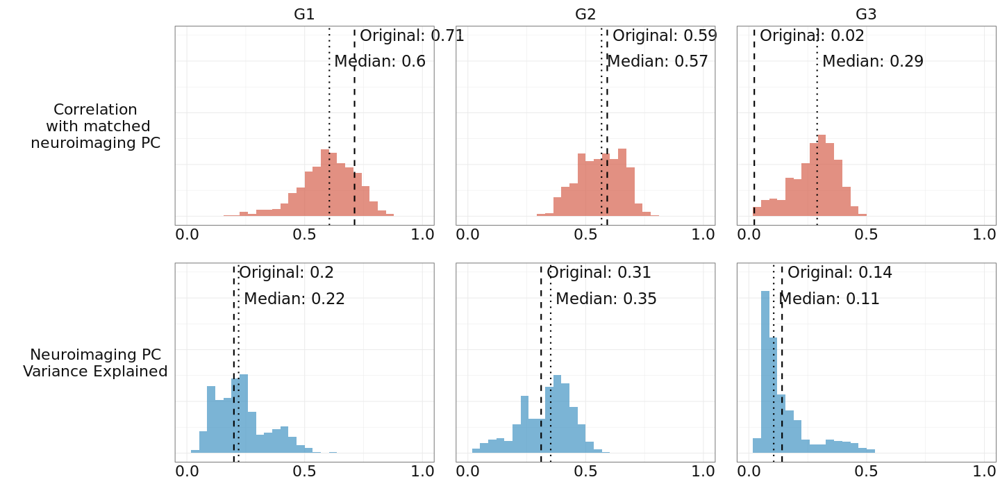

In [2018]:
%%R -i pca_corrs_all -i pca_corrs_boot -w 20 -h 10 --units in
source("../code/plot_maps.R")
plot_maps_pca_boot(pca_corrs_all, pca_corrs_boot)

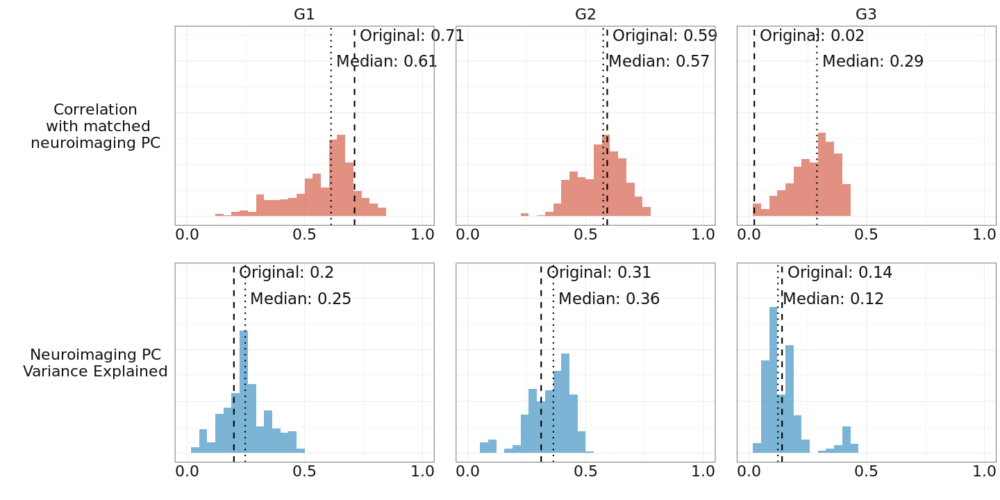

In [2022]:
%%R -i pca_corrs_all -i pca_corrs_boot -w 20 -h 10 --units in
source("../code/plot_maps.R")
plot_maps_pca_boot(pca_corrs_all, pca_corrs_boot)

### VE & Yeo

In [ ]:
hcp_scores = dm_hcp_3d_ds5.clean_scores()
null_scores = np.load('../outputs/permutations/hcp_3d_ds5_spin_5000.npy')

In [2151]:
mesulam_ve_yeo.head()

,label,Mesulam,Mesulam_colors,Mesulam_names,Yeo,Yeo_colors,Yeo_names,vonEconomo,vonEconomo_colors,vonEconomo_names,x,y,z,G1,G2,G3
1,V1,4,#80B1D3,Idiotypic,1,#660066,Visual,5,#fffb00,Sensory 1,11.210,49.816,35.575,2.118002,-2.126003,1.871407
2,MST,3,#FB8072,Unimodal,1,#660066,Visual,4,#f59505,Sensory 2,36.250,34.011,37.570,NaN,NaN,NaN
3,V6,3,#FB8072,Unimodal,1,#660066,Visual,4,#f59505,Sensory 2,10.096,35.750,55.243,NaN,NaN,NaN
4,V2,4,#80B1D3,Idiotypic,1,#660066,Visual,4,#f59505,Sensory 2,11.179,46.890,36.613,2.047980,-1.772881,1.459301
5,V3,4,#80B1D3,Idiotypic,1,#660066,Visual,4,#f59505,Sensory 2,14.580,47.879,37.700,2.032762,-1.899769,1.275806


In [2189]:
atlas_data = pd.read_csv('../data/mesulam_ve_yeo.csv', index_col=0).join(hcp_scores.set_index('label'), on='label')
atlas_stats = {}
for atlas in ['Mesulam', 'vonEconomo', 'Yeo']:
    atlas_regions = atlas_data[atlas].dropna()
    true_means, null_means = compute_region_means(hcp_scores, null_scores, atlas_regions, method='mean')
    atlas_scores_sig = compute_null_p(true_means, null_means, adjust='fdr_bh').assign(label=lambda x: x['label'].astype('string'))
    atlas_colors = (atlas_data.loc[:,[atlas, f'{atlas}_names', f'{atlas}_colors']].set_axis(['label','name','color'],axis=1)
                  .drop_duplicates().assign(label=lambda x: x['label'].astype('string')))
    atlas_stats[atlas] = atlas_scores_sig.join(atlas_colors.set_index('label'), on='label')
atlas_stats = pd.concat(atlas_stats).reset_index(0).rename({'level_0':'atlas'}, axis=1)

/home/jovyan/work/notebooks/../code/mri_maps.py:307: RuntimeWarning: Mean of empty slice
  true[region] = pd.Series(np.nanmean(scores_array[mask, :], axis=0))
/home/jovyan/work/notebooks/../code/mri_maps.py:308: RuntimeWarning: Mean of empty slice
  null[region] = pd.DataFrame(np.nanmean(null_scores[mask, :, :], axis=0)).T
/home/jovyan/work/notebooks/../code/mri_maps.py:308: RuntimeWarning: Mean of empty slice
  null[region] = pd.DataFrame(np.nanmean(null_scores[mask, :, :], axis=0)).T
/home/jovyan/work/notebooks/../code/mri_maps.py:307: RuntimeWarning: Mean of empty slice
  true[region] = pd.Series(np.nanmean(scores_array[mask, :], axis=0))
/home/jovyan/work/notebooks/../code/mri_maps.py:308: RuntimeWarning: Mean of empty slice
  null[region] = pd.DataFrame(np.nanmean(null_scores[mask, :, :], axis=0)).T


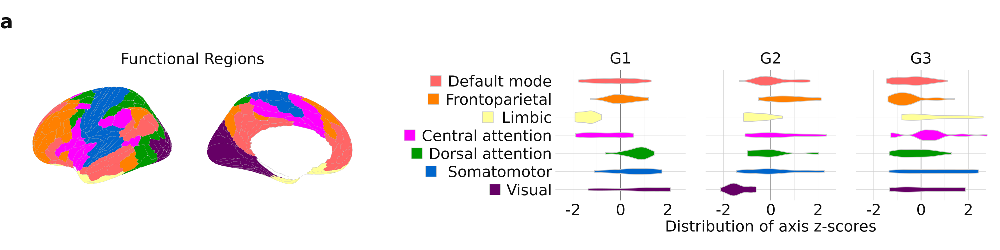

In [2235]:
%%R -w 20 -h 5 --units in -r 200 -i atlas_stats -i atlas_data
source("../code/plot_maps.R")
source("../code/Rplots.R")

g1 <- plot_hcp_wide(hcp_scores) + guides(fill='none') + theme(legend.margin=margin(t = -40, unit='pt'),
                                                              plot.tag.position = c(0, .95))
# g2 = plot_hcp_classes(atlas_data, classes=Mesulam, classcolors=Mesulam_colors, classnames=Mesulam_names, ncol=4) +
#     ggtitle('Laminar Differentiation Regions')
# g2a = plot_atlas_violins(atlas_data, atlas_stats %>% filter(atlas=='Mesulam')) + plot_layout(tag_level='new') +
#     theme(strip.text=element_text(size=22, color='grey7', family='Calibri'))

# g2 = plot_hcp_classes(atlas_data, classes=vonEconomo, classcolors=vonEconomo_colors, classnames=vonEconomo_names, ncol=4) +
#     ggtitle('Cytoarchitectural Regions')
# g2a = plot_atlas_violins(atlas_data, atlas_stats %>% filter(atlas=='vonEconomo'), 
#         classes=vonEconomo, classcolors=vonEconomo_colors, classlabels=vonEconomo_names,
#         legend_positions=c(-5.2,-7.5,-7.5,-6.5,-6.5,-5.4,-5.2)) + plot_layout(tag_level='new')

g2 = plot_hcp_classes(atlas_data, classes=Yeo, classcolors=Yeo_colors, classnames=Yeo_names, ncol=4) +
    ggtitle('Functional Regions')
g2a = plot_atlas_violins(atlas_data, atlas_stats %>% filter(atlas=='Yeo'), 
        classes=Yeo, classcolors=Yeo_colors, classlabels=Yeo_names,
        legend_positions=c(-5.3,-7.9,-8.6,-8.9,-5.6,-7.9,-7.8)) + plot_layout(tag_level='new')

# plot <- g1 / 
plot <-         ((g2 | plot_spacer() | g2a) + plot_layout(widths=c(10,1,12)))

(plot & theme(
    legend.position='none', 
    plot.title=element_text(hjust=0.5, size=22, color='grey7', family='Calibri',margin=margin(b=-80)),
    text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    # legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=0, l=0, "pt"),

    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0, vjust=1)
)) + plot_annotation(tag_level='a')

---

# Other

### Old triplets figure

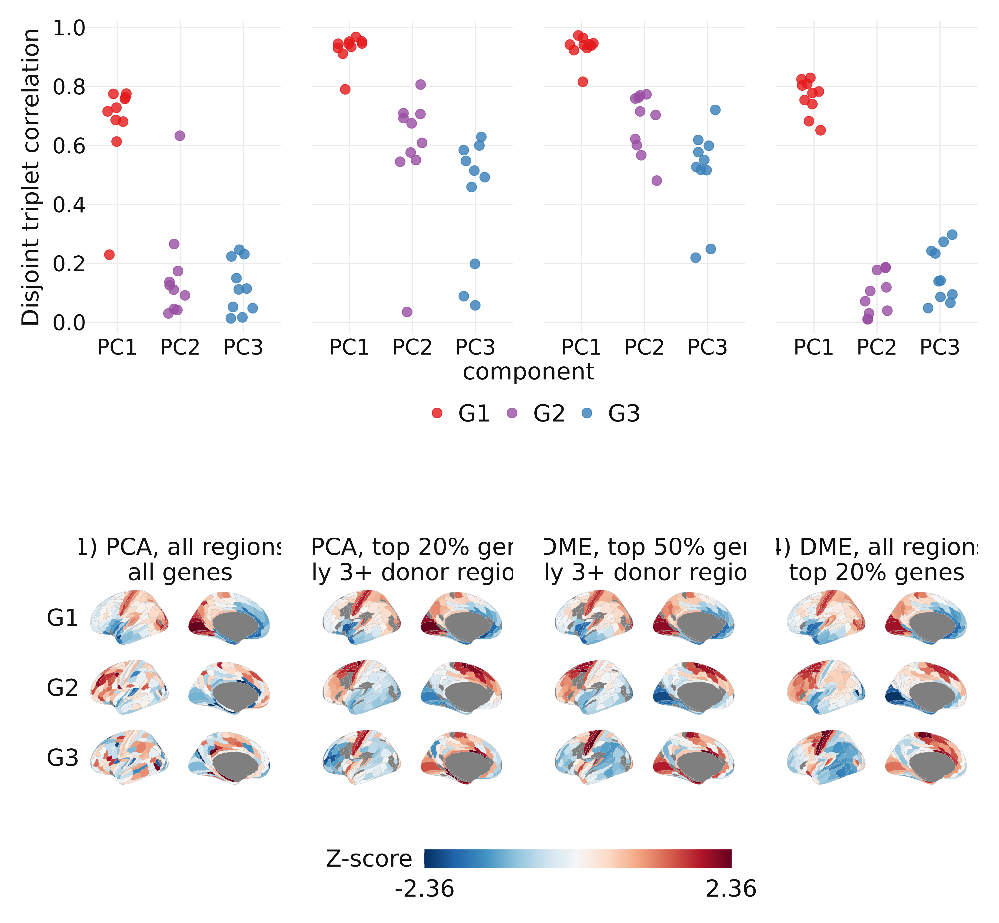

In [983]:
%%R -w 13 -h 12 --units in -r 300 -i triplets_plot_v2 -i versions_scores -i df_triplets_highlight
source("../code/Rplots.R")
source("../code/brainPlots.R")

triplets_plot_v2 %>% mutate(method=recode(method, 'PCA, all regions'='PCA, all regions and genes')) %>% head
g2 <- plot_triplets_simple(triplets_plot_v2 %>% mutate(method=recode(method, 'PCA, all regions'='PCA, all regions and genes')),
        size=4) + 
    theme(axis.text.y=element_text(margin=margin(r=-40)))
# g2 <- plot_triplets_v2(triplets_plot_v2, facet='h') + geom_vline(data=df_triplets_highlight, aes(xintercept=DS), size=10, alpha=.2, color='grey') +
#     theme(axis.text.y=element_text(margin=margin(r=-40)))
g3 <- plot_hcp(versions_scores,# %>% rename(PC1=G1, PC2=G2, PC3=G3),
               spacing_x=2, switch='y') + 
    guides(fill=guide_colorbar(barwidth=20, title='Z-score', title.vjust=1))
    
(g2 / g3) & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    # strip.text=element_text(size=22, color='grey7', family='Calibri'),
    strip.text=element_blank(),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)

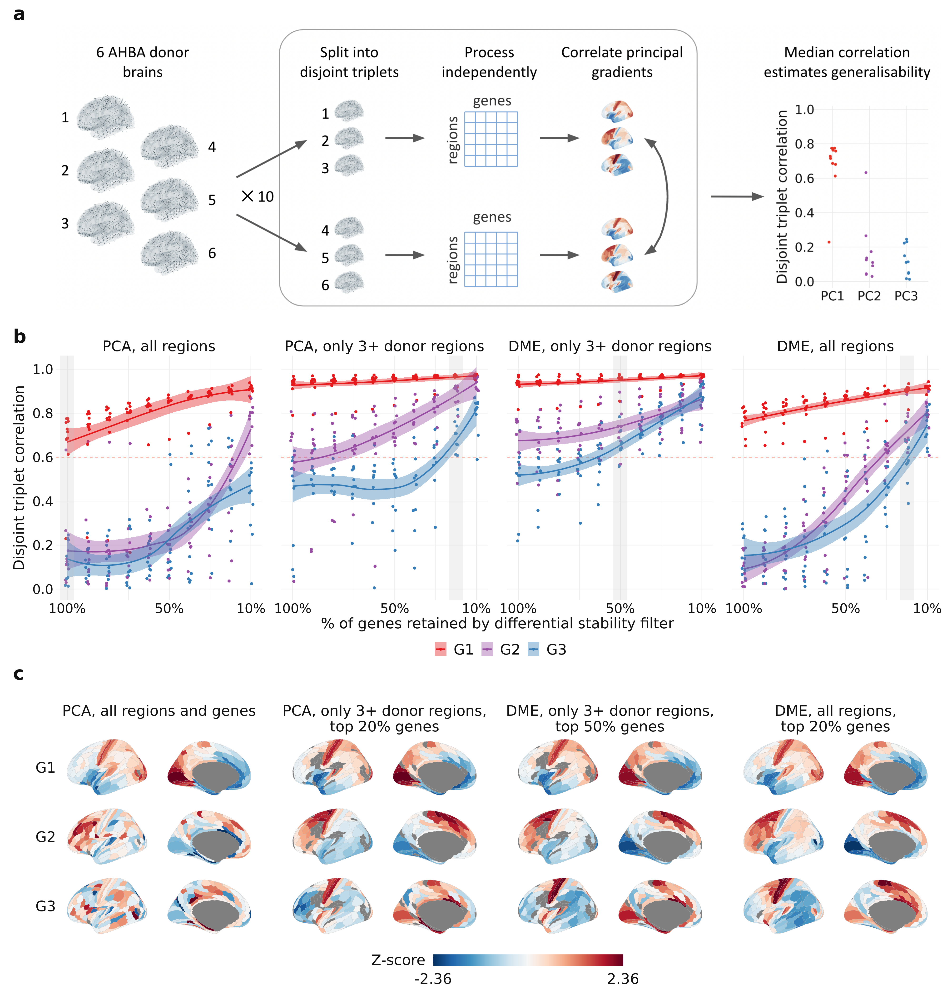

In [ ]:
%%R -w 20 -h 21 --units in -r 200 -i triplets_plot_v2 -i versions_scores -i df_triplets_highlight -i versions_scatter
source("../code/Rplots.R")
source("../code/brainPlots.R")
library(png)
img_path <- "../data/schematics/schem2.png"
img <- readPNG(img_path, native=T)

# g0 <- image_ggplot(img)
g0 <- ggplot() + inset_element(img, left=0,right=1,top=1,bottom=0, align_to='panel',ignore_tag=T)
g2 <- plot_triplets_v2(triplets_plot_v2, facet='h', smooth=T) + geom_vline(data=df_triplets_highlight, aes(xintercept=DS), size=10, alpha=.2, color='grey') +
    theme(axis.text.y=element_text(margin=margin(r=-40))
          # axis.title.y=element_text(margin=margin(r=-10))
         )
# g3a <- plot_hcp(hcp_scores %>% filter(str_detect(version, 'PCA')), spacing_x=2) + theme(legend.position='none', strip.text.y=element_text(margin=margin(l=10)))
# g3b <- plot_hcp(hcp_scores %>% filter(str_detect(version, 'DM')), spacing_x=2) + theme(legend.position='bottom', strip.text.y=element_text(margin=margin(l=10))) + 
#         guides(fill=guide_colorbar(title='Score', barwidth=10, title.vjust=1)) + plot_layout(tag_level='new')
g3 <- plot_hcp(versions_scores, spacing_x=2, switch='y') + 
    guides(fill=guide_colorbar(barwidth=20, title='Z-score', title.vjust=1)) +
    theme(strip.text.y=element_text(margin=margin(l=10)))
# g4 <- plot_scatter_corrs(versions_scatter, size=8,
#                          xlab='DME scores,\n3+ donor regions,\ntop 50% genes', 
#                          ylab='DME scores, all regions, \ntop 20% genes')

layout <- c(
  area(t = 1, b = 19, l = 1, r = 48),
  area(t = 20, b = 34, l = 1, r = 48),
  area(t = 35, b = 48, l = 1, r = 48)
  # area(t = 6, b = 7, l = 6, r = 10),
#   area(t = 1, b = 17, l = 40, r = 48)
)

plot <- g0 + g2 + g3 + plot_layout(design=layout)

themed <- plot & theme(
    text=element_text(size=22, color='grey7', family='Calibri'), 
    strip.text=element_text(size=22, color='grey7', family='Calibri'),
    legend.text=element_text(size=22, color='grey7', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=10, l=10, "pt"),
    plot.tag.position = c(0, 1),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)


annotated <- themed + plot_annotation(
  tag_level='a',
  # caption = caption,
  theme = theme(plot.caption = element_textbox_simple(size = 20, padding = unit(c(40, 5, 5, 5), "pt")))
)
annotated
# ggsave(filename='test2.png', device='png')

### Gene stability with/without donor filter

In [ ]:
# _, gene_stability_all, region_stability_all = get_expression_abagen(fetch_hcp(), return_stability=True)
# _, gene_stability_2donors, region_stability_2donors = get_expression_abagen(fetch_hcp(), donors_threshold=2, return_stability=True)
# _, gene_stability_3donors, region_stability_3donors = get_expression_abagen(fetch_hcp(), donors_threshold=3, return_stability=True)

In [ ]:
# gene_stability_versions = pd.concat({
#     'All regions': gene_stability_all,
#     '2+ donor regions': gene_stability_2donors,
#     '3+ donor regions': gene_stability_3donors
# }).to_frame().reset_index().set_axis(['version', 'gene', 'stability'],axis=1)
# gene_stability_versions.to_csv("../outputs/gene_stability_versions.csv")
# gene_stability_versions.head()

,version,gene,stability
0,All regions,A1BG,0.423881
1,All regions,A1BG-AS1,0.181750
2,All regions,A2M,0.074123
3,All regions,A2ML1,-0.027128
4,All regions,A3GALT2,0.014360


In [ ]:
weights_version = dm_hcp_3d_ds5
weights = dm_hcp_3d_ds5.weights.iloc[:,:3]
nulls = shuffle_gene_weights(weights, n=5000, rank=False)

### Disorder weight scatters

In [ ]:
gandal_genes = get_gandal_genes()
weights_labels = get_gene_weights_with_labels(weights, gandal_genes).assign(label = lambda x: pd.Categorical(x['label'], 
                                                                     categories=['ASD','SCZ','MDD'], ordered=True))

### Brainchart PLS

In [ ]:
from sklearn.cross_decomposition import PLSCanonical
X = dk_scores.drop('label',axis=1).values

brainchart_pls = {}
for d in brainchart_maps.columns:
    Y = brainchart_maps[d]
    loadings = PLSCanonical(n_components=1).fit(X,Y).x_loadings_
    brainchart_pls[d] = pd.Series(loadings.squeeze())

df_pls = (pd.concat(brainchart_pls).unstack(1).set_axis(['G1','G2','G3'],axis=1)
    .melt(ignore_index=False,var_name='G',value_name='weight')
    .reset_index().rename({'index':'d'},axis=1)
)
df_pls


,d,G,weight
0,ASD,G1,0.774145
1,MDD,G1,0.842699
2,SCZ,G1,0.220781
3,ASD,G2,-0.569960
4,MDD,G2,-0.644831
5,SCZ,G2,-0.604163
6,ASD,G3,0.372992
7,MDD,G3,-0.008714
8,SCZ,G3,0.806577


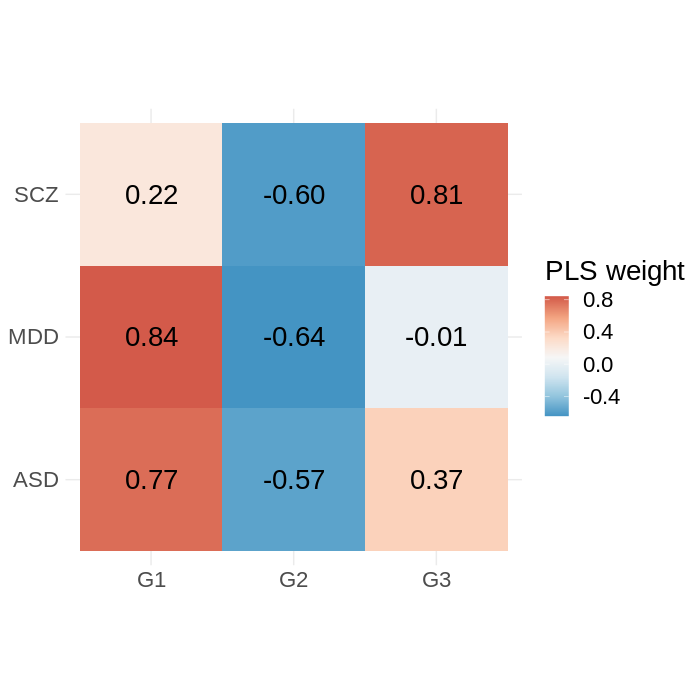

In [ ]:
%%R -i df_pls -w 7 -h 7 --units in -r 100
df_pls %>%
ggplot() +
geom_tile(aes(G,d,fill=weight)) +
geom_text(aes(G,d, label=sprintf("%0.2f", round(weight, digits = 2))), size=7) +
scale_fill_gradientn(colors=rev(brewer.rdbu(100)[20:80]), name='PLS weight') +
theme_minimal() + theme(
    axis.title=element_blank(),
    aspect.ratio=1, text=element_text(size=20))

### Disgenet enrichments

In [2125]:
disgenet_genes = (pd.read_csv("../data/disgenet_genes.csv")
    # .loc[:,['Disease','Gene','Score_gda']]
    .assign(score_pct = lambda x: x.groupby('Disease')['Score_gda'].rank(pct=True))
    # .loc[lambda x: x['score_pct'] >= 0.75]
    .rename({'Disease':'label','Gene':'gene'},axis=1)
    .replace({
        'Autism Spectrum Disorders':'ASD',
        'Major Depressive Disorder':'MDD',
        'Schizophrenia':'SCZ'
    })
)
disgenet_genes

,label,Disease_id,gene,Gene_id,UniProt,Gene_Full_Name,Protein_Class,N_diseases_g,DSI_g,DPI_g,pLI,Score_gda,EL_gda,EI_gda,N_PMIDs,N_SNPs_gda,First_Ref,Last_Ref,score_pct
0,ASD,C1510586,CHD8,57680,Q9HCK8,chromodomain helicase DNA binding protein 8,NaN,66,0.656,0.577,1.000000e+00,0.80,definitive,0.974,38,0,2012.0,2020.0,1.000000
1,ASD,C1510586,NRXN2,9379,P58401;Q9P2S2,neurexin 2,NaN,18,0.769,0.308,9.993400e-01,0.74,moderate,1.000,5,0,2011.0,2018.0,0.999066
2,ASD,C1510586,CNTNAP2,26047,Q9UHC6,contactin associated protein 2,NaN,203,0.530,0.846,2.867300e-09,0.70,NaN,0.976,42,5,2008.0,2020.0,0.997666
3,ASD,C1510586,SHANK3,85358,Q9BYB0,SH3 and multiple ankyrin repeat domains 3,NaN,169,0.550,0.731,1.000000e+00,0.70,NaN,0.976,84,8,2007.0,2020.0,0.997666
4,ASD,C1510586,NLGN3,54413,Q9NZ94,neuroligin 3,NaN,63,0.653,0.462,9.764100e-01,0.60,strong,0.960,25,5,2003.0,2019.0,0.995798
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5174,SCZ,C0036341,ARNT2,9915,Q9HBZ2,aryl hydrocarbon receptor nuclear translocator 2,Transcription factor,89,0.599,0.731,9.914200e-01,0.01,NaN,1.000,1,0,2014.0,2014.0,0.159819
5175,SCZ,C0036341,WDR1,9948,O75083,WD repeat domain 1,Cellular structure,59,0.623,0.654,9.989200e-01,0.01,NaN,1.000,1,0,2009.0,2009.0,0.159819
5176,SCZ,C0036341,NR1H4,9971,Q96RI1,nuclear receptor subfamily 1 group H member 4,Nuclear receptor,187,0.513,0.808,9.389200e-04,0.01,NaN,1.000,1,0,2016.0,2016.0,0.159819
5177,SCZ,C0036341,THOC1,9984,Q96FV9,THO complex 1,Nucleic acid binding,35,0.691,0.500,9.995500e-01,0.01,NaN,1.000,1,0,2005.0,2005.0,0.159819


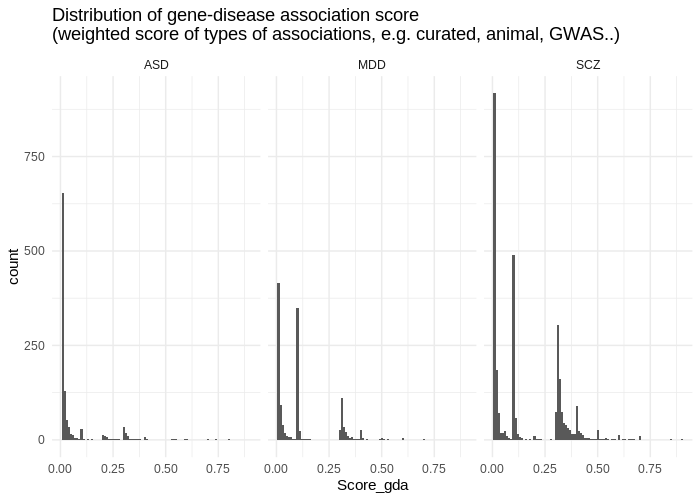

In [2089]:
%%R -i disgenet_genes -w 7 -h 5 --units in -r 100
disgenet_genes %>% 
ggplot(aes(x=Score_gda)) + facet_wrap(~label) +
geom_histogram(binwidth=.01) +
# ggplot(aes(x=label, y=Score_gda)) + 
# geom_jitter(alpha=.5, color='lightblue', shape=21) + xlab('') +
# geom_boxplot(fill=NA, width=.1) +
ggtitle('Distribution of gene-disease association score\n(weighted score of types of associations, e.g. curated, animal, GWAS..)') +
theme_minimal()

In [2094]:
disgenet_genes.groupby('label')['Score_gda'].quantile(.75)

label
ASD    0.03
MDD    0.10
SCZ    0.31
Name: Score_gda, dtype: float64

In [2148]:
# disgenet_genes_clean = disgenet_genes.loc[lambda x: x['UniProt'].notnull()]
# disgenet_genes_clean = disgenet_genes.loc[lambda x: x['score_pct'] >= .75]
# disgenet_genes_clean = disgenet_genes.loc[lambda x: x['Score_gda'] >= .4]
# disgenet_genes_clean = disgenet_genes.loc[lambda x: x['Score_gda'] >= .3]
disgenet_genes_clean = disgenet_genes
disgenet_stats = compute_null_p(*compute_enrichments(weights, nulls, disgenet_genes_clean))
# disgenet_stats = compute_null_p(*compute_enrichments(weights.abs(), np.abs(nulls), disgenet_genes_clean))

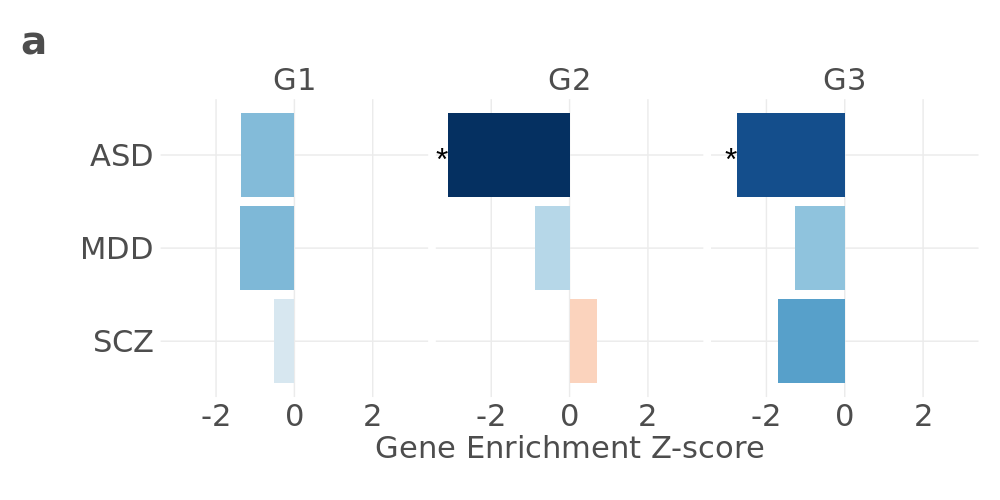

In [2149]:
%%R -i disgenet_stats -w 10 -h 5 --units in -r 100
g1 = plot_enrichment_bars_z(disgenet_stats, xlab='Gene Enrichment Z-score')

((g1) & theme(
  text=element_text(size=22, color='grey30', family='Calibri'), 
  axis.text=element_text(size=22, color='grey30', family='Calibri'),
  strip.text=element_text(size=22, color='grey30', family='Calibri'),
  legend.text=element_text(size=22, color='grey30', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=20, l=10, "pt"),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)) + plot_annotation(tag_level='a')

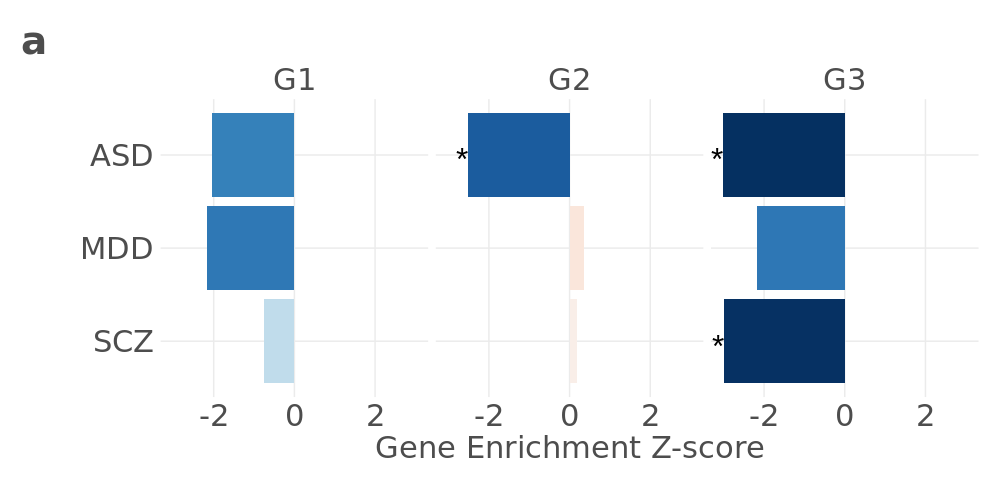

In [ ]:
%%R -i disgenet_stats -w 10 -h 5 --units in -r 100
g1 = plot_enrichment_bars_z(disgenet_stats, xlab='Gene Enrichment Z-score')

((g1) &theme(
  text=element_text(size=22, color='grey30', family='Calibri'), 
  axis.text=element_text(size=22, color='grey30', family='Calibri'),
  strip.text=element_text(size=22, color='grey30', family='Calibri'),
  legend.text=element_text(size=22, color='grey30', family='Calibri'),
    plot.margin = margin(t=10, r=10, b=20, l=10, "pt"),
    plot.tag = element_text(size=28, face='bold', family='Calibri', hjust=0)
)) + plot_annotation(tag_level='a')

### Disorder DEG enrichments

In [ ]:
gandal_genes_enrichment_dict = {
    'upreg.': get_gene_sig(weights, nulls, gandal_genes, posneg='pos'),
    'downreg.': get_gene_sig(weights, nulls, gandal_genes, posneg='neg'),
}

In [ ]:
gandal_genes_enrichment = (pd.concat(gandal_genes_enrichment_dict)
                           # .assign(updown = lambda x: x.index.get_level_values(0).astype('str'))
                           .assign(label = lambda x: pd.Categorical(x['label'], 
                                                                     categories=['ASD','SCZ','MDD'], ordered=True))
                           .assign(updown = lambda x: pd.Categorical(x.index.get_level_values(0).astype('str'), 
                                                                     categories=['upreg.','downreg.'], ordered=True))
                           .sort_values(['label','updown'])
                           .assign(label = lambda x: x['label'].astype('str') + ' ' + x['updown'].astype('str'))
                          )

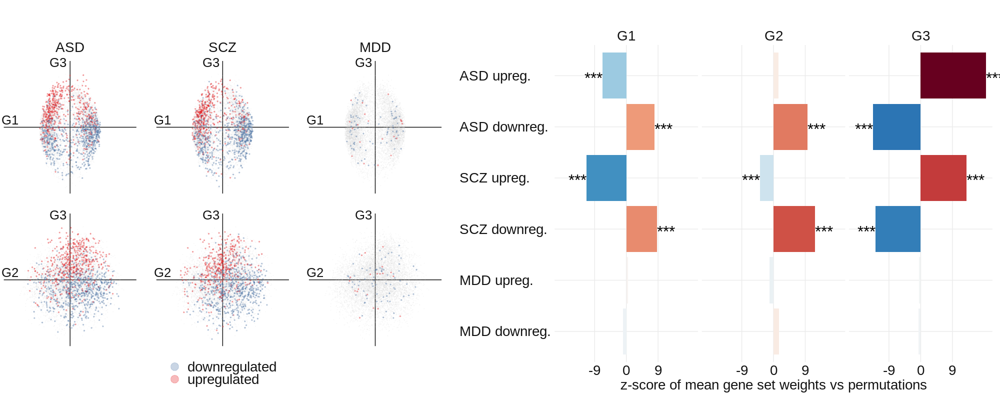

In [ ]:
%%R -i weights_labels -i gandal_genes_enrichment -w 20 -h 8 --units in -r 100
source('../code/enrichmentsPlots.R')
g1 <- plot_weight_scatters_with_labels(weights_labels, colors=rev(brewer.set1(10)[1:2]), drop='G1 v G2') + guides(colour = guide_legend(override.aes = list(size=5)))
g2 <- plot_enrichment_bars_z(gandal_genes_enrichment, xlab='z-score of mean gene set weights vs permutations') + theme(axis.text.y = element_text(hjust=0))
plot1 <- g1 + g2
plot1

---

### Compare with Jake's maps

In [95]:
jake_axes = (pd.read_csv('../data/tx_PLScomps_jake_glasser.csv')
             .set_axis([i+1 for i in range(180)]).join(get_labels_hcp()).set_index('label')
             .apply(lambda x: (x-np.mean(x))/np.std(x))
            )
jake_axes

,TxGrad1,TxGrad2,TxGrad3
label,,,
V1,2.379033,-0.847172,1.729835
MST,0.774669,-1.193433,0.444441
V6,0.613730,-1.369562,1.325712
V2,2.063502,-1.163917,1.681928
V3,1.702069,-1.454998,1.415406
...,...,...,...
STSva,0.613368,-0.252974,-1.729379
TE1m,0.569421,-0.538692,-1.749047
PI,0.805728,0.584211,-1.708206


In [96]:
sim_grads = np.load("../outputs/permutations/hcp_ds8_sim_1000.npy")
# sim_grads = np.load("../outputs/permutations/hcp_3d_ds5_sim_1000.npy")
null_corrs = corr_nulls_from_grads(sim_grads, hcp_scores, jake_axes, method='pearson')
null_p = get_null_p(corrs, null_corrs, adjust=None)

In [114]:
maps_scatter = (jake_axes
                .melt(ignore_index=False, var_name='map', value_name='map_score')
                .join(hcp_scores.set_index('label')).reset_index()
                .set_index(['label','map','map_score'])
                .melt(ignore_index=False, var_name='G', value_name='G_score')
                .reset_index()
               )
maps_scatter_corrs = null_p.loc[:,['map','G','true_mean','q']].assign(q=1)

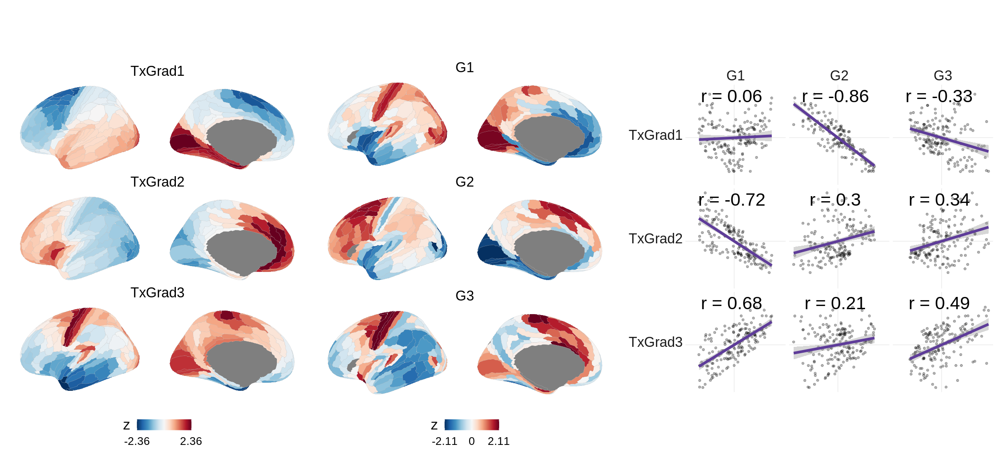

In [119]:
%%R -i hcp_scores -i maps_scatter -i maps_scatter_corrs -i jake_axes -w 22 -h 10 --units in -r 100
source("../code/plot_maps.R")

g1 <- plot_maps(jake_axes, ncol=1, colors=rev(brewer.rdbu(100)), spacing=0) 
g2 <- plot_hcp(hcp_scores, facet='w')
g4 <- plot_maps_scatter(maps_scatter, maps_scatter_corrs, x=0, y=2.5, size=10)

((g1 | g2) | g4) & theme(text=element_text(size=22), strip.text=element_text(size=22))

In [125]:
hcp_scores.corr().round(2)

,G1,G2,G3
G1,1.0,-0.0,0.0
G2,-0.0,1.0,0.0
G3,0.0,0.0,1.0


In [124]:
jake_axes.corr().round(2)

,TxGrad1,TxGrad2,TxGrad3
TxGrad1,1.00,-0.51,-0.29
TxGrad2,-0.51,1.00,-0.22
TxGrad3,-0.29,-0.22,1.00


In [130]:
dm_hcp_ds8.weights.corr().round(2)

,0,1,2,3,4
0,1.00,0.03,-0.02,0.15,0.13
1,0.03,1.00,0.30,0.03,0.21
2,-0.02,0.30,1.00,-0.11,-0.17
3,0.15,0.03,-0.11,1.00,-0.01
4,0.13,0.21,-0.17,-0.01,1.00
